In [2]:
# all modules
import math
import numpy as np
import scipy.io as sio
import scipy.signal as ssi
from scipy import stats
from scipy import special
import pandas as pd
from IPython.display import display, HTML, Image

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.lines import Line2D 
import seaborn as sns

import sys
import distutils.dir_util
import shutil
from pathlib import Path
import os
from datetime import datetime
from datetime import timedelta
import time
from textwrap import wrap
import scipy.optimize
from scipy.stats import t
from sklearn.linear_model import LinearRegression
from sklearn import metrics
import multiprocessing
import multiprocessing.pool
from lmfit.models import ExponentialModel
from lmfit.models import PowerLawModel
from lmfit import Model

import scipy.optimize

import logging
import jupyter_auxilariy_functions
import importlib

importlib.reload(jupyter_auxilariy_functions)

%matplotlib notebook
plt.rcParams['figure.figsize'] = [15, 8]
plt.rcParams['figure.dpi'] = 100

%matplotlib inline
sns.set_context('notebook')
%config InlineBackend.figure_format = 'retina'
sns.set(rc={'figure.figsize':(4,3)})
sns.set_style()
# sns.set_context("paper")

pd.set_option('display.max_rows', None)

HTML("""<style type="text/css">
  table.dataframe td, table.dataframe th {
    max-width: none;
    white-space: normal;
    line-height: normal;
    padding: 0.3em 0.5em;
  }
</style>
""")


# Device Data analysis - 20210905A

## Overview of data folder:

In [2]:
%%bash
find /proj/boyan/flat_data_pool/20211016 -type d -print  

/proj/boyan/flat_data_pool/20211016
/proj/boyan/flat_data_pool/20211016/two_terminal
/proj/boyan/flat_data_pool/20211016/two_terminal/dna
/proj/boyan/flat_data_pool/20211016/two_terminal/dna/200bps_-625mV
/proj/boyan/flat_data_pool/20211016/two_terminal/dna/200bps_-825mV
/proj/boyan/flat_data_pool/20211016/two_terminal/dna/200bps_-200mV
/proj/boyan/flat_data_pool/20211016/two_terminal/dna/200bps_-300mV
/proj/boyan/flat_data_pool/20211016/two_terminal/dna/200bps_500mV
/proj/boyan/flat_data_pool/20211016/two_terminal/dna/200bps_-155mV
/proj/boyan/flat_data_pool/20211016/two_terminal/dna/200bps_-175mV
/proj/boyan/flat_data_pool/20211016/two_terminal/dna/200bps_-250mV
/proj/boyan/flat_data_pool/20211016/two_terminal/dna/200bps_-800mV
/proj/boyan/flat_data_pool/20211016/two_terminal/dna/200bps_-600mV
/proj/boyan/flat_data_pool/20211016/two_terminal/no_dna
/proj/boyan/flat_data_pool/20211016/three_terminal
/proj/boyan/flat_data_pool/20211016/three_terminal/dna
/proj/boyan/flat_data_pool/2021

# Eventfinding on PINUP DATA

## 200bps, -800mV bias

create new branch (only once executed)
* specify branch name,
* specify data path (as list if multiple folders)
* specify parent folder of Schnellstapel installation to do the operations (assumes DataAndResults folder and Schnellstapel folder)

In [6]:
jupyter_auxilariy_functions.make_branch('20210905A_pu-200bps--800-1', 
                    ['/proj/boyan/flat_data_pool/20211016/two_terminal/dna/200bps_-800mV'], 
                    LOC = '/proj/boyan/repos/schnellstapel')

0

checkout the branch you want in the analyse
* specify branch name
* specify parent folder of Schnellstapel installation

In [7]:
jupyter_auxilariy_functions.checkout('20210905A_pu-200kbs--800-1', LOC = '/proj/boyan/repos/schnellstapel')

256

specify python analysis cmd as string

In [8]:
pythonCMD = '"python3  src/main.py -t $(THREADS) -f 100000 --filterType Bessel --instrumentType Chimera --findevents --kvalueanalysis --mineventdepth 1000 --PDF 6.0 --PDFreversal 0.5 --eventType both --passes 4 --avwindow 0.5 --plotidealevents 1.0 --picklesegment"'

run function to batch submit
* specify cmd
* specify location of Schnellstapel installation

In [9]:
jupyter_auxilariy_functions.batch_run(pythonCMD, NCPU = 3, MEM = 50000, LR = 8, QU='CH', LOC = '/proj/boyan/repos/schnellstapel')

0

after batch process is finished: move data to permanent location

In [10]:
%mv /proj/boyan/repos/schnellstapel/DataAndResults/results /proj/boyan/repos/schnellstapel/DataAndResults/ImportantResultsArchive/20210905A_pu-200pbs--800-1_newEoE_woHistBaseline_idealtrace/

## 200bps, -825mV bias

create new branch (only once executed)
* specify branch name,
* specify data path (as list if multiple folders)
* specify parent folder of Schnellstapel installation to do the operations (assumes DataAndResults folder and Schnellstapel folder)

In [11]:
jupyter_auxilariy_functions.make_branch('20210905A_pu-200bps--825-1', 
                    ['/proj/boyan/flat_data_pool/20211016/two_terminal/dna/200bps_-825mV'], 
                    LOC = '/proj/boyan/repos/schnellstapel')

0

checkout the branch you want in the analyse
* specify branch name
* specify parent folder of Schnellstapel installation

In [12]:
jupyter_auxilariy_functions.checkout('20210905A_pu-200kbs--800-1', LOC = '/proj/boyan/repos/schnellstapel')

256

specify python analysis cmd as string

In [39]:
pythonCMD = '"python3  src/main.py -t $(THREADS) -f 100000 --instrumentType Chimera --findevents --kvalueanalysis --mineventdepth 1000 --PDF 6.0 --PDFreversal 0.5 --eventType both --passes 4 --avwindow 0.5 --plotidealevents 1.0 --picklesegment"'

run function to batch submit
* specify cmd
* specify location of Schnellstapel installation

In [13]:
jupyter_auxilariy_functions.batch_run(pythonCMD, NCPU = 3, MEM = 50000, LR = 8, QU='CH', LOC = '/proj/boyan/repos/schnellstapel')

0

after batch process is finished: move data to permanent location

In [14]:
%mv /proj/boyan/repos/schnellstapel/DataAndResults/results /proj/boyan/repos/schnellstapel/DataAndResults/ImportantResultsArchive/20210905A_pu-200pbs--825-1_newEoE_woHistBaseline_idealtrace/

## 200bps, -625mV bias

create new branch (only once executed)
* specify branch name,
* specify data path (as list if multiple folders)
* specify parent folder of Schnellstapel installation to do the operations (assumes DataAndResults folder and Schnellstapel folder)

In [15]:
jupyter_auxilariy_functions.make_branch('20210905A_pu-200bps--625-1', 
                    ['/proj/boyan/flat_data_pool/20211016/two_terminal/dna/200bps_-625mV'], 
                    LOC = '/proj/boyan/repos/schnellstapel')

0

checkout the branch you want in the analyse
* specify branch name
* specify parent folder of Schnellstapel installation

In [16]:
jupyter_auxilariy_functions.checkout('20210905A_pu-200kbs--625-1', LOC = '/proj/boyan/repos/schnellstapel')

256

specify python analysis cmd as string

In [17]:
pythonCMD = '"python3  src/main.py -t $(THREADS) -f 100000 --instrumentType Chimera --findevents --kvalueanalysis --mineventdepth 1000 --PDF 6.0 --PDFreversal 0.5 --eventType both --passes 4 --avwindow 0.5 --plotidealevents 1.0 --picklesegment"'

run function to batch submit
* specify cmd
* specify location of Schnellstapel installation

In [17]:
jupyter_auxilariy_functions.batch_run(pythonCMD, NCPU = 3, MEM = 50000, LR = 8, QU='CH', LOC = '/proj/boyan/repos/schnellstapel')

0

after batch process is finished: move data to permanent location

In [18]:
%mv /proj/boyan/repos/schnellstapel/DataAndResults/results /proj/boyan/repos/schnellstapel/DataAndResults/ImportantResultsArchive/20210905A_pu-200pbs--625-1_newEoE_woHistBaseline_idealtrace/

load data frame #stopped here, didn't do this

In [309]:
resultsPath = Path('/proj/schnellstapel/jakobuchheim/superLatticeData/20210602A_pu-1kbs--800-1_newEoE_woHistBaseline_idealtrace/')
files_for_frame = sorted(resultsPath.rglob('./dataframe_atruntime_*.csv'))
# import all data frames in folder
DFlist = []
for fileN in files_for_frame:
    DFlist.append(pd.read_csv(fileN))
statsDF = pd.concat(DFlist, ignore_index = True)
statsDF = statsDF.rename(columns = {'Unnamed: 0':'EXPERIMENTNAME'})

load event frames

In [310]:
resultsPath = Path('/proj/schnellstapel/jakobuchheim/superLatticeData/20210602A_pu-1kbs--800-1_newEoE_woHistBaseline_idealtrace/')
files_for_frame = sorted(resultsPath.rglob('./*/*events.csv'))
# import all data frames in folder
DFlist = []
for fileN in files_for_frame:
    tmp = pd.read_csv(fileN)
    tmp['EXPERIMENTNAME'] = str(fileN.name).split('_events')[0]
    DFlist.append(tmp)
eventsDF = pd.concat(DFlist, ignore_index = True)

merge eventsframe and dataframe

In [311]:
df = pd.merge(eventsDF, statsDF, how = 'left', on = ["EXPERIMENTNAME"])

do what ever you want with the data

## 200bps,-600mV bias

In [20]:
jupyter_auxilariy_functions.make_branch('20210905A_pu-200bps--600-1', 
                    ['/proj/boyan/flat_data_pool/20211016/two_terminal/dna/200bps_-600mV'], 
                    LOC = '/proj/boyan/repos/schnellstapel')

0

In [21]:
jupyter_auxilariy_functions.checkout('20210905A_pu-200kbs--600-1', LOC = '/proj/boyan/repos/schnellstapel')

256

In [22]:
pythonCMD = '"python3  src/main.py -t $(THREADS) -f 100000 --instrumentType Chimera --findevents --kvalueanalysis --mineventdepth 1000 --PDF 6.0 --PDFreversal 0.5 --eventType both --passes 4 --avwindow 0.5 --plotidealevents 1.0 --picklesegment"'

In [25]:
jupyter_auxilariy_functions.batch_run(pythonCMD, NCPU = 3, MEM = 50000, LR = 8, QU='CH', LOC = '/proj/boyan/repos/schnellstapel')

0

In [26]:
%mv /proj/boyan/repos/schnellstapel/DataAndResults/results /proj/boyan/repos/schnellstapel/DataAndResults/ImportantResultsArchive/20210905A/20210905A_pu-200pbs--600-1_newEoE_woHistBaseline_idealtrace/

## 200bps, -300mV bias

In [74]:
jupyter_auxilariy_functions.make_branch('20210905A_pu-200bps--300-1', 
                    ['/proj/boyan/flat_data_pool/20211016/two_terminal/dna/200bps_-300mV'], 
                    LOC = '/proj/boyan/repos/schnellstapel')

jupyter_auxilariy_functions.checkout('20210905A_pu-200kbs--300-1', LOC = '/proj/boyan/repos/schnellstapel')
pythonCMD = '"python3  src/main.py -t $(THREADS) -f 100000 --instrumentType Chimera --findevents --kvalueanalysis --mineventdepth 150 --interpolateBaseline --PDF 2.2 --PDFreversal 1 --eventType both --passes 6 --avwindow 1 --plotidealevents 10 --picklesegment"'
jupyter_auxilariy_functions.batch_run(pythonCMD, NCPU = 3, MEM = 50000, LR = 8, QU='CH', LOC = '/proj/boyan/repos/schnellstapel')

0

In [75]:
pythonCMD = '"python3  src/main.py -t $(THREADS) -f 100000 --instrumentType Chimera --plotevents --keep --mineventdepth 150 --interpolateBaseline --PDF 2.2 --PDFreversal 1 --eventType both --passes 6 --avwindow 1"'
jupyter_auxilariy_functions.batch_run(pythonCMD, NCPU = 3, MEM = 50000, LR = 8, QU='CH', LOC = '/proj/boyan/repos/schnellstapel')

0

In [70]:
%mv /proj/boyan/repos/schnellstapel/DataAndResults/results /proj/boyan/repos/schnellstapel/DataAndResults/ImportantResultsArchive/20210905A/20210905A_pu-200pbs--300-1_newEoE_woHistBaseline_idealtrace/

In [28]:
jupyter_auxilariy_functions.make_branch('20210905A_pu-200bps--250-1', 
                    ['/proj/boyan/flat_data_pool/20211016/two_terminal/dna/200bps_-250mV'], 
                    LOC = '/proj/boyan/repos/schnellstapel')

jupyter_auxilariy_functions.checkout('20210905A_pu-200kbs--250-1', LOC = '/proj/boyan/repos/schnellstapel')

pythonCMD = '"python3  src/main.py -t $(THREADS) -f 100000 --instrumentType Chimera --findevents --kvalueanalysis --mineventdepth 150 --interpolateBaseline --PDF 2.2 --PDFreversal 1 --eventType both --passes 6 --avwindow 1 --plotidealevents 1.0 --picklesegment"'

jupyter_auxilariy_functions.batch_run(pythonCMD, NCPU = 3, MEM = 50000, LR = 8, QU='CH', LOC = '/proj/boyan/repos/schnellstapel')

0

In [29]:
%mv /proj/boyan/repos/schnellstapel/DataAndResults/results /proj/boyan/repos/schnellstapel/DataAndResults/ImportantResultsArchive/20210905A/20210905A_pu-200pbs--250-1_newEoE_woHistBaseline_idealtrace/

In [63]:
resultsPath = Path('/proj/boyan/repos/schnellstapel/DataAndResults/ImportantResultsArchive/20210905A/20210905A_pu-200pbs--300-1_newEoE_woHistBaseline_idealtrace/')
files_for_frame = sorted(resultsPath.rglob('./dataframe_atruntime_*.csv'))
# import all data frames in folder
DFlist = []
for fileN in files_for_frame:
    DFlist.append(pd.read_csv(fileN))
statsDF = pd.concat(DFlist, ignore_index = True)
statsDF = statsDF.rename(columns = {'Unnamed: 0':'EXPERIMENTNAME'})

In [64]:
resultsPath = Path('/proj/boyan/repos/schnellstapel/DataAndResults/ImportantResultsArchive/20210905A/20210905A_pu-200pbs--300-1_newEoE_woHistBaseline_idealtrace/')
files_for_frame = sorted(resultsPath.rglob('./*/*events.csv'))
# import all data frames in folder
DFlist = []
for fileN in files_for_frame:
    tmp = pd.read_csv(fileN)
    tmp['EXPERIMENTNAME'] = str(fileN.name).split('_events')[0]
    DFlist.append(tmp)
eventsDF = pd.concat(DFlist, ignore_index = True)

In [65]:
df = pd.merge(eventsDF, statsDF, how = 'left', on = ["EXPERIMENTNAME"])

In [66]:
a = df.loc[df['EVENTTYPE'] == 'down'].groupby('EXPERIMENTNAME')[['NUMBEROFEVENTS_x']].count()

In [67]:
df_m300mV = df.loc[df['EVENTTYPE'] == 'down'].groupby('EXPERIMENTNAME').aggregate(
    {'NUMBEROFEVENTS_x': np.count_nonzero,'TOTALTRACETIME_x': np.mean,'EVENTDEPTH': np.mean,'EVENTDWELLTIME': np.median,'VAG_y': np.nanmean,'VGC': np.nanmean})
df_m300mV['EVENTRATE']=df_m250mV['NUMBEROFEVENTS_x'] / df_m300mV['TOTALTRACETIME_x'] * 1e6
display(df_m300mV)

,NUMBEROFEVENTS_x,TOTALTRACETIME_x,EVENTDEPTH,EVENTDWELLTIME,VAG_y,VGC,EVENTRATE
EXPERIMENTNAME,,,,,,,
20211018-121449_20210905A_100mMKCl_pinup200bpsssDNA2_-300_mV_0_-300mV,53,57881395.2,-291.360945,33220.8,NaN,NaN,NaN


<AxesSubplot:ylabel='NUMBEROFEVENTS_x'>

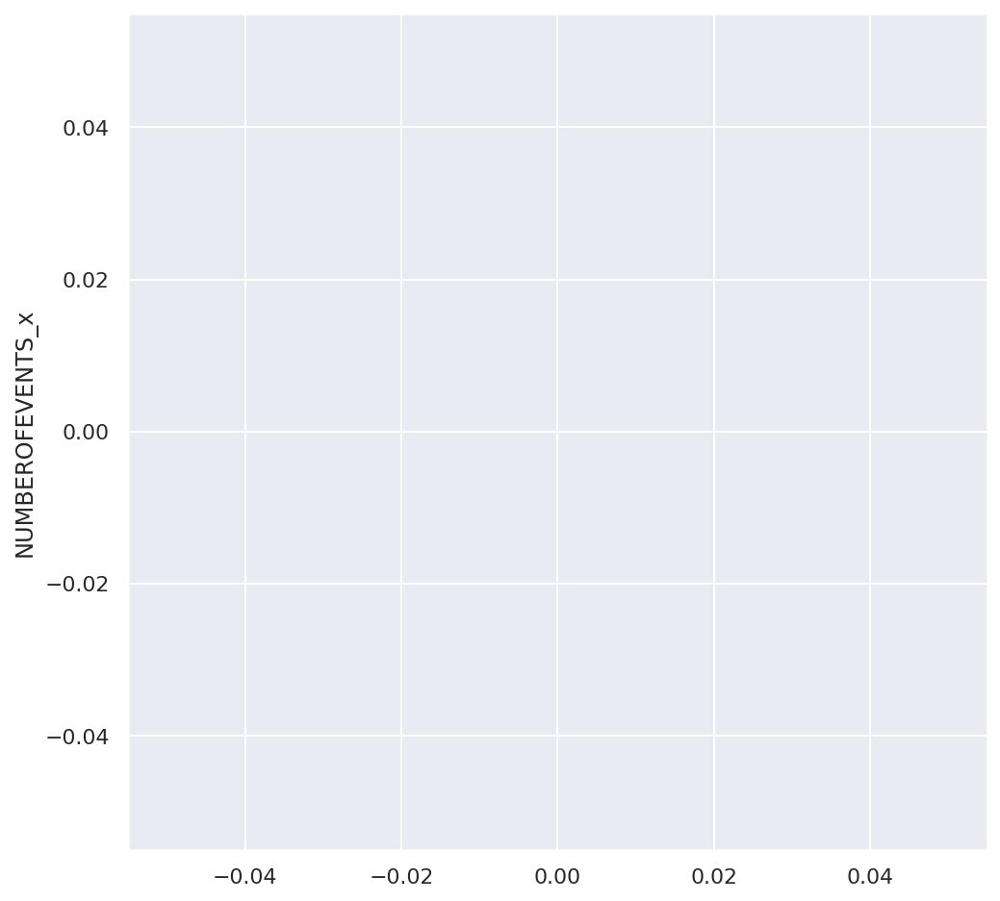

In [60]:
sns.scatterplot(x='VAG_y', y='NUMBEROFEVENTS_x', data=df_m300mV)

<AxesSubplot:ylabel='EVENTDWELLTIME'>

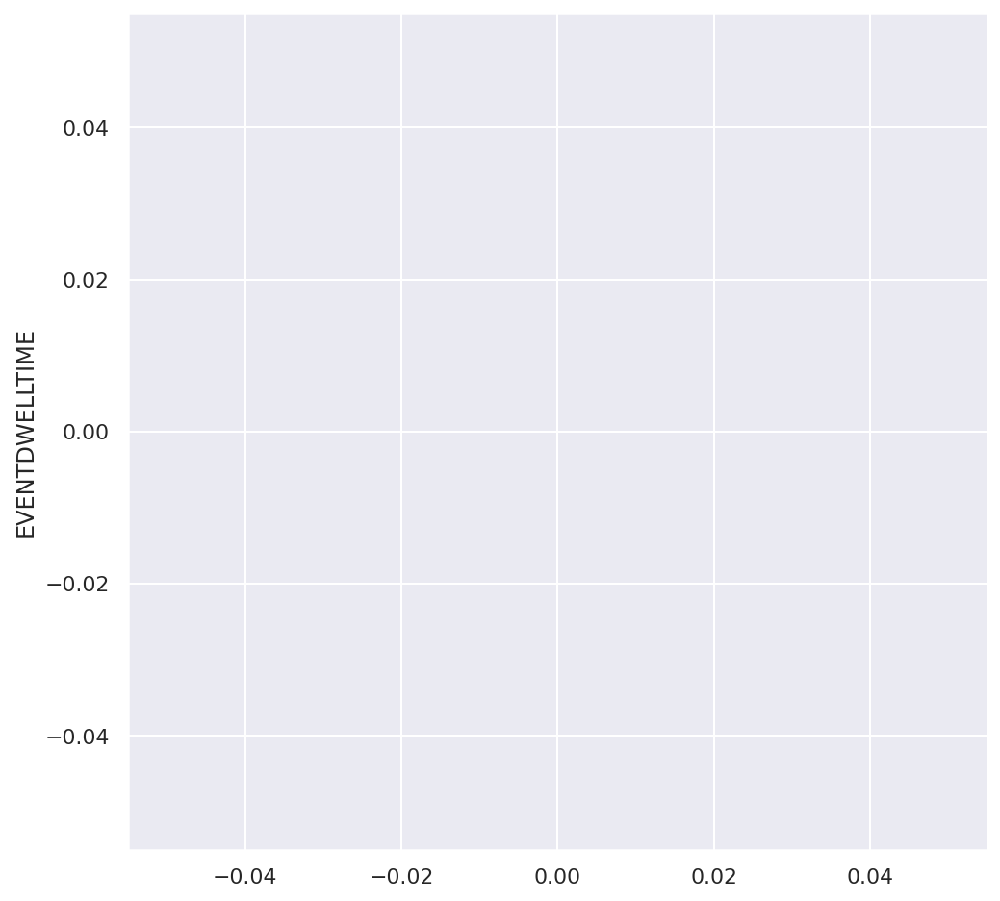

In [61]:
sns.scatterplot(x='VAG_y', y='EVENTDWELLTIME', data=df_m300mV)

Text(0, 0.5, 'event depth [pA]')

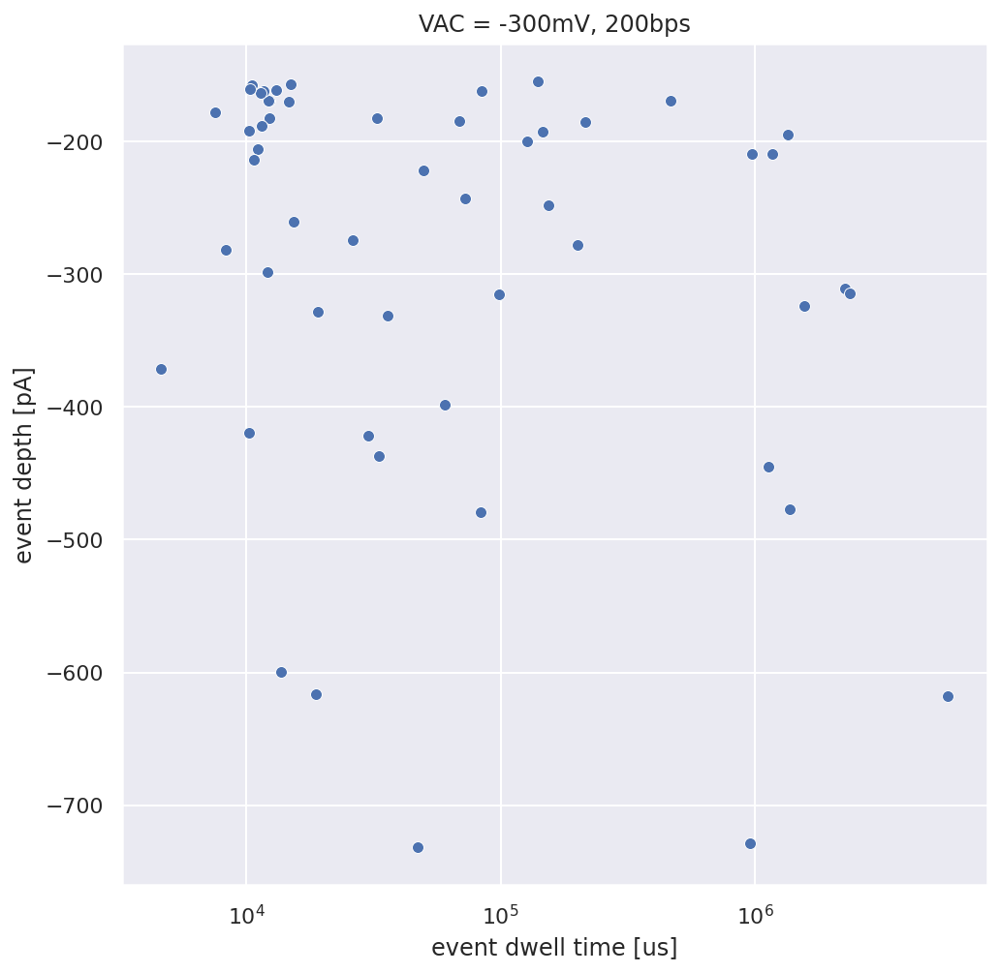

In [68]:
sns.set(rc={'figure.figsize':(8,8)})
sns.set_style()
p = sns.scatterplot(x = 'EVENTDWELLTIME', y = 'EVENTDEPTH', hue = 'VAG_y', data = df.loc[((df['EVENTDWELLTIME'] >0) &(df['EVENTTYPE'] =='down') &~((df['VAG_y']<-1000)&(df['EVENTDEPTH']>-7500)))])
p.set(xscale="log")
plt.title('VAC = -300mV, 200bps')
plt.xlabel('event dwell time [us]')
plt.ylabel('event depth [pA]')

## 200bps, -250mV bias

In [28]:
jupyter_auxilariy_functions.make_branch('20210905A_pu-200bps--250-1', 
                    ['/proj/boyan/flat_data_pool/20211016/two_terminal/dna/200bps_-250mV'], 
                    LOC = '/proj/boyan/repos/schnellstapel')

jupyter_auxilariy_functions.checkout('20210905A_pu-200kbs--250-1', LOC = '/proj/boyan/repos/schnellstapel')

pythonCMD = '"python3  src/main.py -t $(THREADS) -f 100000 --instrumentType Chimera --findevents --kvalueanalysis --mineventdepth 150 --interpolateBaseline --PDF 2.2 --PDFreversal 1 --eventType both --passes 6 --avwindow 1 --plotidealevents 1.0 --picklesegment"'

jupyter_auxilariy_functions.batch_run(pythonCMD, NCPU = 3, MEM = 50000, LR = 8, QU='CH', LOC = '/proj/boyan/repos/schnellstapel')

0

In [29]:
%mv /proj/boyan/repos/schnellstapel/DataAndResults/results /proj/boyan/repos/schnellstapel/DataAndResults/ImportantResultsArchive/20210905A/20210905A_pu-200pbs--250-1_newEoE_woHistBaseline_idealtrace/

In [51]:
resultsPath = Path('/proj/boyan/repos/schnellstapel/DataAndResults/ImportantResultsArchive/20210905A/20210905A_pu-200pbs--250-1_newEoE_woHistBaseline_idealtrace/')
files_for_frame = sorted(resultsPath.rglob('./dataframe_atruntime_*.csv'))
# import all data frames in folder
DFlist = []
for fileN in files_for_frame:
    DFlist.append(pd.read_csv(fileN))
statsDF = pd.concat(DFlist, ignore_index = True)
statsDF = statsDF.rename(columns = {'Unnamed: 0':'EXPERIMENTNAME'})

In [56]:
resultsPath = Path('/proj/boyan/repos/schnellstapel/DataAndResults/ImportantResultsArchive/20210905A/20210905A_pu-200pbs--250-1_newEoE_woHistBaseline_idealtrace/')
files_for_frame = sorted(resultsPath.rglob('./*/*events.csv'))
# import all data frames in folder
DFlist = []
for fileN in files_for_frame:
    tmp = pd.read_csv(fileN)
    tmp['EXPERIMENTNAME'] = str(fileN.name).split('_events')[0]
    DFlist.append(tmp)
eventsDF = pd.concat(DFlist, ignore_index = True)

In [57]:
df = pd.merge(eventsDF, statsDF, how = 'left', on = ["EXPERIMENTNAME"])

In [58]:
a = df.loc[df['EVENTTYPE'] == 'down'].groupby('EXPERIMENTNAME')[['NUMBEROFEVENTS_x']].count()

In [59]:
df_m250mV = df.loc[df['EVENTTYPE'] == 'down'].groupby('EXPERIMENTNAME').aggregate(
    {'NUMBEROFEVENTS_x': np.count_nonzero,'TOTALTRACETIME_x': np.mean,'EVENTDEPTH': np.mean,'EVENTDWELLTIME': np.median,'VAG_y': np.nanmean,'VGC': np.nanmean})
df_m250mV['EVENTRATE']=df_m250mV['NUMBEROFEVENTS_x'] / df_m250mV['TOTALTRACETIME_x'] * 1e6
display(df_m250mV)

,NUMBEROFEVENTS_x,TOTALTRACETIME_x,EVENTDEPTH,EVENTDWELLTIME,VAG_y,VGC,EVENTRATE
EXPERIMENTNAME,,,,,,,
20211018-121559_20210905A_100mMKCl_pinup200bpsssDNA2_-250_mV_0_-250mV,29,32715571.2,-241.534323,22099.2,NaN,NaN,0.886428


<AxesSubplot:ylabel='NUMBEROFEVENTS_x'>

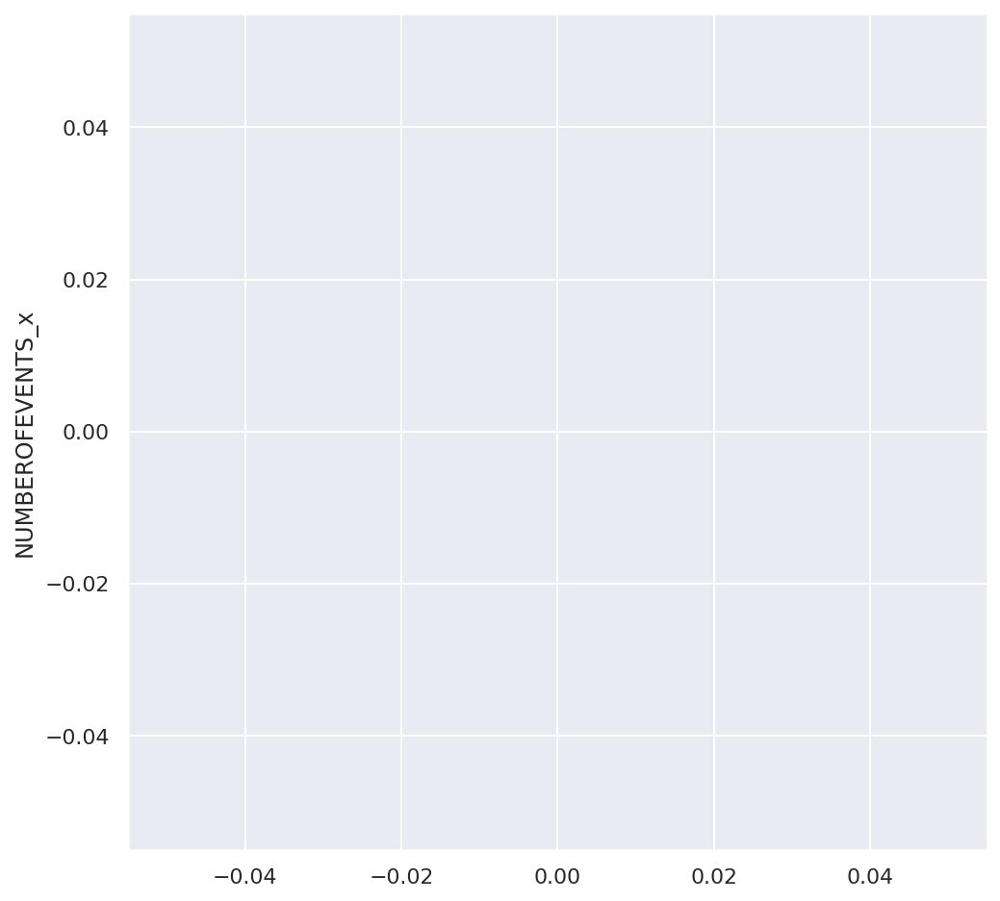

In [60]:
sns.scatterplot(x='VAG_y', y='NUMBEROFEVENTS_x', data=df_m250mV)

<AxesSubplot:ylabel='EVENTDWELLTIME'>

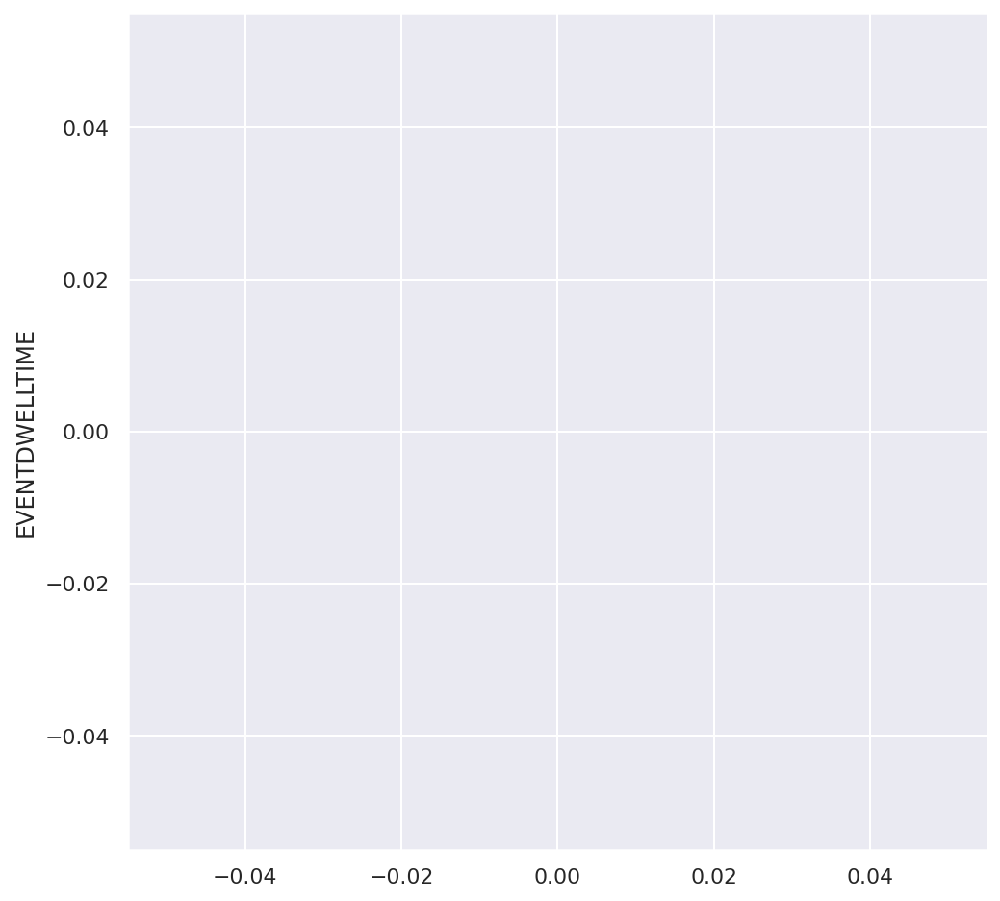

In [61]:
sns.scatterplot(x='VAG_y', y='EVENTDWELLTIME', data=df_m250mV)

Text(0, 0.5, 'event depth [pA]')

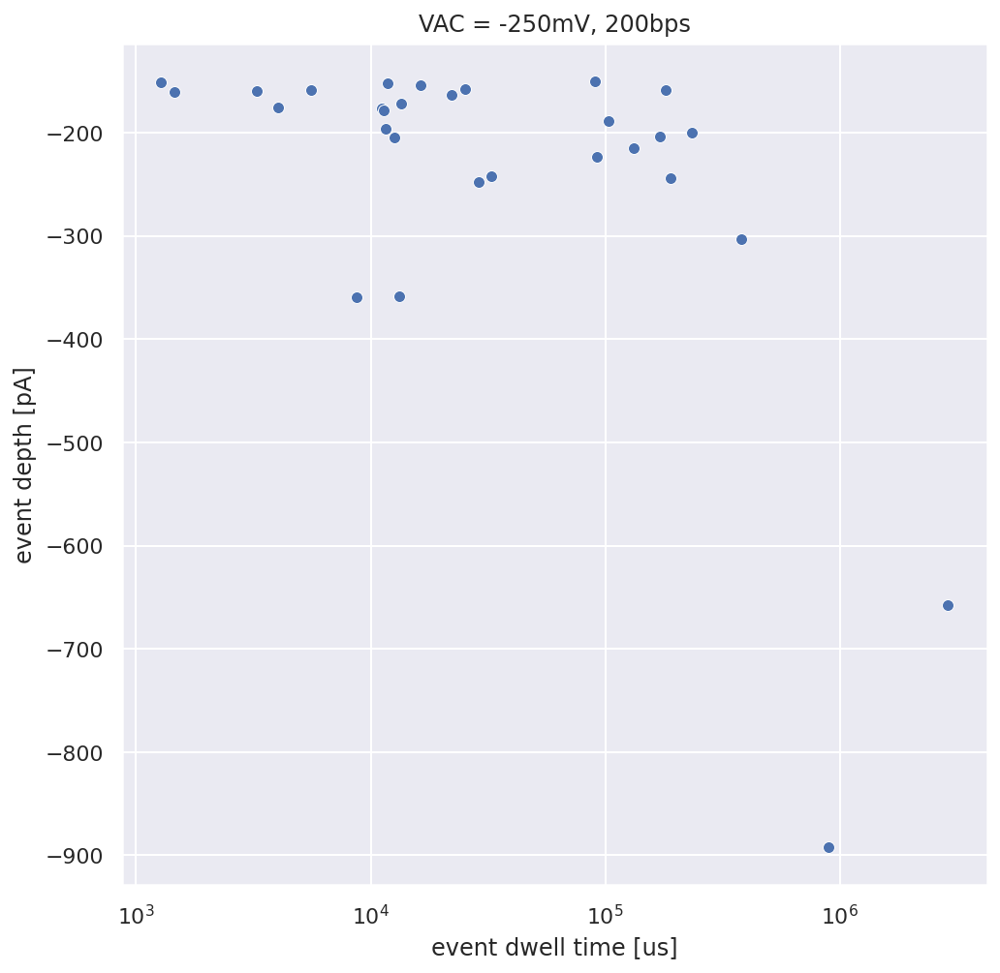

In [62]:
sns.set(rc={'figure.figsize':(8,8)})
sns.set_style()
p = sns.scatterplot(x = 'EVENTDWELLTIME', y = 'EVENTDEPTH', hue = 'VAG_y', data = df.loc[((df['EVENTDWELLTIME'] >0) &(df['EVENTTYPE'] =='down') &~((df['VAG_y']<-1000)&(df['EVENTDEPTH']>-7500)))])
p.set(xscale="log")
plt.title('VAC = -250mV, 200bps')
plt.xlabel('event dwell time [us]')
plt.ylabel('event depth [pA]')

## 200bps, -200mV bias

In [30]:
jupyter_auxilariy_functions.make_branch('20210905A_pu-200bps--200-1', 
                    ['/proj/boyan/flat_data_pool/20211016/two_terminal/dna/200bps_-200mV'], 
                    LOC = '/proj/boyan/repos/schnellstapel')

jupyter_auxilariy_functions.checkout('20210905A_pu-200kbs--200-1', LOC = '/proj/boyan/repos/schnellstapel')

pythonCMD = '"python3  src/main.py -t $(THREADS) -f 100000 --instrumentType Chimera --findevents --kvalueanalysis --mineventdepth 150 --interpolateBaseline --PDF 2.2 --PDFreversal 1 --eventType both --passes 6 --avwindow 1 --plotidealevents 1.0 --picklesegment"'

jupyter_auxilariy_functions.batch_run(pythonCMD, NCPU = 3, MEM = 50000, LR = 8, QU='CH', LOC = '/proj/boyan/repos/schnellstapel')

0

In [31]:
%mv /proj/boyan/repos/schnellstapel/DataAndResults/results /proj/boyan/repos/schnellstapel/DataAndResults/ImportantResultsArchive/20210905A/20210905A_pu-200pbs--200-1_newEoE_woHistBaseline_idealtrace/

In [29]:
resultsPath = Path('/proj/boyan/repos/schnellstapel/DataAndResults/ImportantResultsArchive/20210905A/20210905A_pu-200pbs--200-1_newEoE_woHistBaseline_idealtrace/')
files_for_frame = sorted(resultsPath.rglob('./dataframe_atruntime_*.csv'))
# import all data frames in folder
DFlist = []
for fileN in files_for_frame:
    DFlist.append(pd.read_csv(fileN))
statsDF = pd.concat(DFlist, ignore_index = True)
statsDF = statsDF.rename(columns = {'Unnamed: 0':'EXPERIMENTNAME'})

In [30]:
resultsPath = Path('/proj/boyan/repos/schnellstapel/DataAndResults/ImportantResultsArchive/20210905A/20210905A_pu-200pbs--200-1_newEoE_woHistBaseline_idealtrace/')
files_for_frame = sorted(resultsPath.rglob('./*/*events.csv'))
# import all data frames in folder
DFlist = []
for fileN in files_for_frame:
    tmp = pd.read_csv(fileN)
    tmp['EXPERIMENTNAME'] = str(fileN.name).split('_events')[0]
    DFlist.append(tmp)
eventsDF = pd.concat(DFlist, ignore_index = True)

In [31]:
df = pd.merge(eventsDF, statsDF, how = 'left', on = ["EXPERIMENTNAME"])

In [32]:
a = df.loc[df['EVENTTYPE'] == 'down'].groupby('EXPERIMENTNAME')[['NUMBEROFEVENTS_x']].count()

In [33]:
df_m200mV = df.loc[df['EVENTTYPE'] == 'down'].groupby('EXPERIMENTNAME').aggregate(
    {'NUMBEROFEVENTS_x': np.count_nonzero,'TOTALTRACETIME_x': np.mean,'EVENTDEPTH': np.mean,'EVENTDWELLTIME': np.median,'VAG_y': np.nanmean,'VGC': np.nanmean})
df_m200mV['EVENTRATE']=df_m200mV['NUMBEROFEVENTS_x'] / df_m200mV['TOTALTRACETIME_x'] * 1e6
display(df_m200mV)

,NUMBEROFEVENTS_x,TOTALTRACETIME_x,EVENTDEPTH,EVENTDWELLTIME,VAG_y,VGC,EVENTRATE
EXPERIMENTNAME,,,,,,,
20211018-121641_20210905A_100mMKCl_pinup200bpsssDNA2_-200_mV_0_-200mV,11,55364812.8,-243.097957,112975.2,NaN,NaN,0.198682


<AxesSubplot:ylabel='NUMBEROFEVENTS_x'>

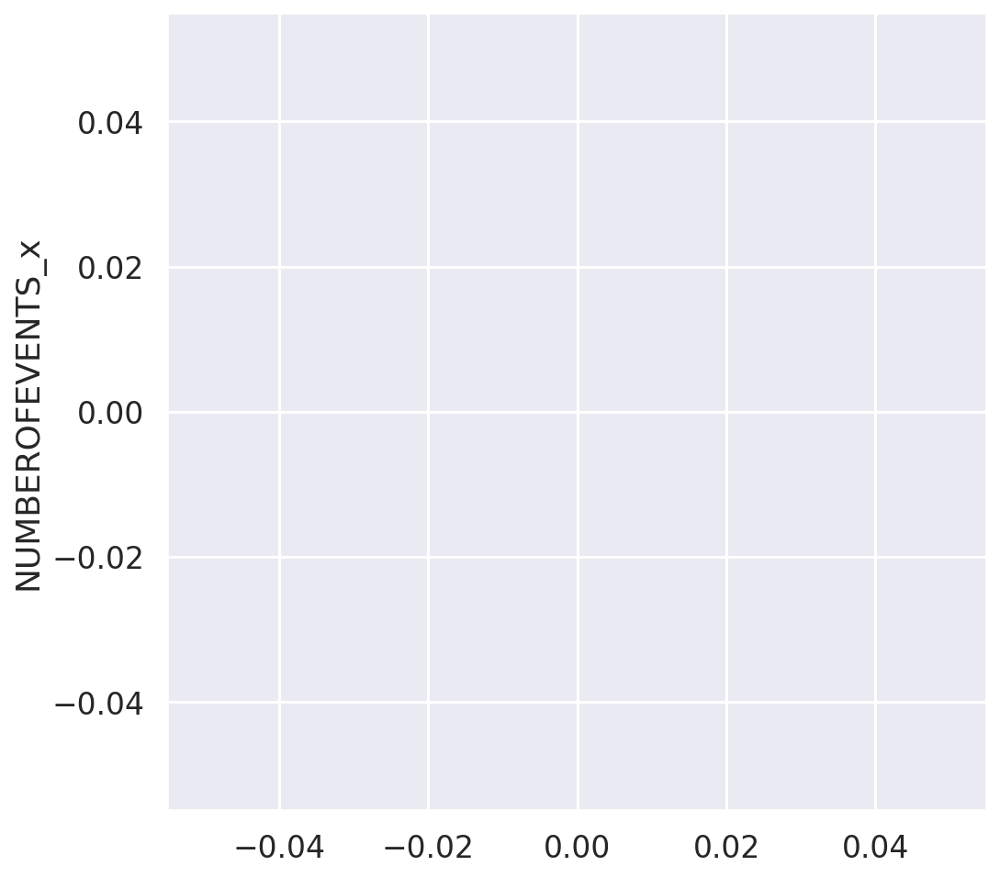

In [36]:
sns.scatterplot(x='VAG_y', y='NUMBEROFEVENTS_x', data=df_m200mV)

<AxesSubplot:ylabel='EVENTDWELLTIME'>

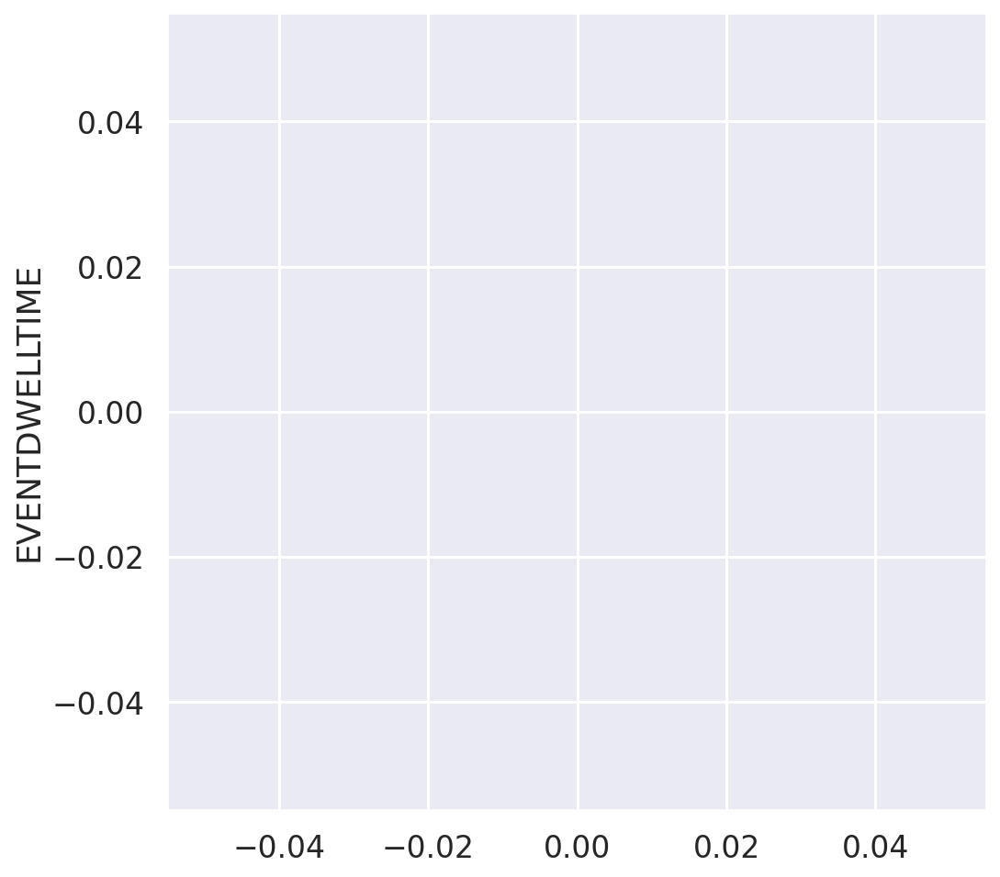

In [37]:
sns.scatterplot(x='VAG_y', y='EVENTDWELLTIME', data=df_m200mV)

Text(0, 0.5, 'event depth [pA]')

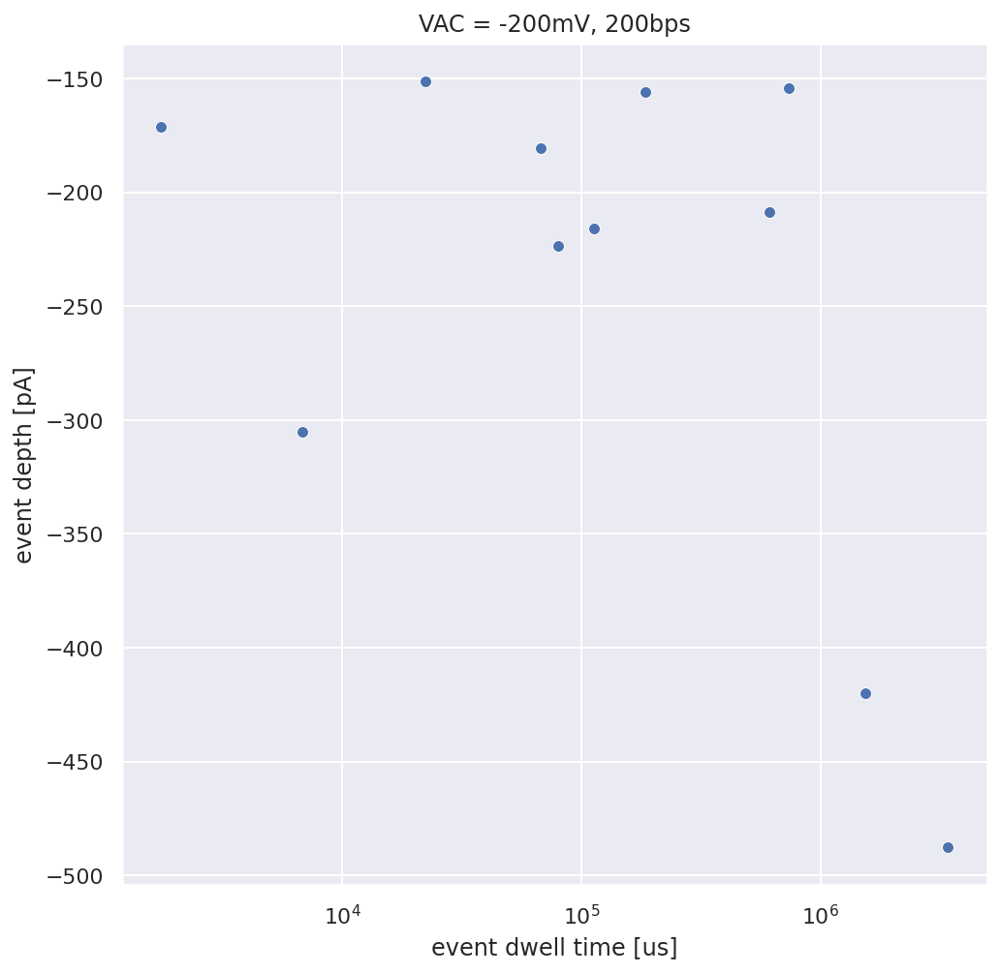

In [50]:
sns.set(rc={'figure.figsize':(8,8)})
sns.set_style()
p = sns.scatterplot(x = 'EVENTDWELLTIME', y = 'EVENTDEPTH', hue = 'VAG_y', data = df.loc[((df['EVENTDWELLTIME'] >0) &(df['EVENTTYPE'] =='down') &~((df['VAG_y']<-1000)&(df['EVENTDEPTH']>-7500)))])
p.set(xscale="log")
plt.title('VAC = -200mV, 200bps')
plt.xlabel('event dwell time [us]')
plt.ylabel('event depth [pA]')

## 200bps, -175mV bias

In [20]:
jupyter_auxilariy_functions.make_branch('20210905A_pu-200bps--175-1', 
                    ['/proj/boyan/flat_data_pool/20211016/two_terminal/dna/200bps_-175mV'], 
                    LOC = '/proj/boyan/repos/schnellstapel')

jupyter_auxilariy_functions.checkout('20210905A_pu-200kbs--175-1', LOC = '/proj/boyan/repos/schnellstapel')

pythonCMD = '"python3  src/main.py -t $(THREADS) -f 100000 --instrumentType Chimera --findevents --kvalueanalysis --mineventdepth 150 --interpolateBaseline --PDF 2.2 --PDFreversal 1 --eventType both --passes 6 --avwindow 1 --plotidealevents 1.0 --picklesegment"'

jupyter_auxilariy_functions.batch_run(pythonCMD, NCPU = 3, MEM = 50000, LR = 8, QU='CH', LOC = '/proj/boyan/repos/schnellstapel')

0

In [21]:
%mv /proj/boyan/repos/schnellstapel/DataAndResults/results /proj/boyan/repos/schnellstapel/DataAndResults/ImportantResultsArchive/20210905A/20210905A_pu-200pbs--175-1_newEoE_woHistBaseline_idealtrace/

## 200bps, -155mV bias

In [22]:
jupyter_auxilariy_functions.make_branch('20210905A_pu-200bps--155-1', 
                    ['/proj/boyan/flat_data_pool/20211016/two_terminal/dna/200bps_-155mV'], 
                    LOC = '/proj/boyan/repos/schnellstapel')

jupyter_auxilariy_functions.checkout('20210905A_pu-200kbs--155-1', LOC = '/proj/boyan/repos/schnellstapel')

pythonCMD = '"python3  src/main.py -t $(THREADS) -f 100000 --instrumentType Chimera --findevents --kvalueanalysis --mineventdepth 150 --interpolateBaseline --PDF 2.2 --PDFreversal 1 --eventType both --passes 6 --avwindow 1 --plotidealevents 1.0 --picklesegment"'

jupyter_auxilariy_functions.batch_run(pythonCMD, NCPU = 3, MEM = 50000, LR = 8, QU='CH', LOC = '/proj/boyan/repos/schnellstapel')

0

In [23]:
%mv /proj/boyan/repos/schnellstapel/DataAndResults/results /proj/boyan/repos/schnellstapel/DataAndResults/ImportantResultsArchive/20210905A/20210905A_pu-200pbs--155-1_newEoE_woHistBaseline_idealtrace/

## 200bps, 500mV bias

In [24]:
jupyter_auxilariy_functions.make_branch('20210905A_pu-200bps-500-1', 
                    ['/proj/boyan/flat_data_pool/20211016/two_terminal/dna/200bps_500mV'], 
                    LOC = '/proj/boyan/repos/schnellstapel')

jupyter_auxilariy_functions.checkout('20210905A_pu-200kbs-500-1', LOC = '/proj/boyan/repos/schnellstapel')

pythonCMD = '"python3  src/main.py -t $(THREADS) -f 100000 --instrumentType Chimera --findevents --kvalueanalysis --mineventdepth 150 --interpolateBaseline --PDF 2.2 --PDFreversal 1 --eventType both --passes 6 --avwindow 1 --plotidealevents 1.0 --picklesegment"'

jupyter_auxilariy_functions.batch_run(pythonCMD, NCPU = 3, MEM = 50000, LR = 8, QU='CH', LOC = '/proj/boyan/repos/schnellstapel')

0

In [25]:
%mv /proj/boyan/repos/schnellstapel/DataAndResults/results /proj/boyan/repos/schnellstapel/DataAndResults/ImportantResultsArchive/20210905A/20210905A_pu-200pbs-500-1_newEoE_woHistBaseline_idealtrace/

## 200bps, -200mV bias PINDOWN

In [37]:
jupyter_auxilariy_functions.make_branch('20210905A_pd-200bps--200-1', 
                    ['/proj/boyan/flat_data_pool/20211016/three_terminal/dna/'], 
                    LOC = '/proj/boyan/repos/schnellstapel')

jupyter_auxilariy_functions.checkout('20210905A_pd-200kbs--200-1', LOC = '/proj/boyan/repos/schnellstapel')
pythonCMD = '"python3  src/main.py -t 8 -f 100000 --instrumentType Chimera --findevents --mineventdepth 150 --PDF 2.2 --PDFreversal 1 --eventType both --passes 6 --avwindow 1 --picklesegment"'
jupyter_auxilariy_functions.batch_run(pythonCMD, NCPU = 1, MEM = 200000, LR = 8, QU='CH', LOC = '/proj/boyan/repos/schnellstapel')

0

In [25]:
%mv /proj/boyan/repos/schnellstapel/DataAndResults/results /proj/boyan/repos/schnellstapel/DataAndResults/ImportantResultsArchive/20210905A/20210905A_pd-200pbs--200-1_newEoE_woHistBaseline_idealtrace/

## Two-terminal IV

In [8]:
jupyter_auxilariy_functions.make_branch('20210905A_pu_IV', 
                    ['/proj/boyan/flat_data_pool/20211016/two_terminal/no_dna/'], 
                    LOC = '/proj/boyan/repos/schnellstapel')

jupyter_auxilariy_functions.checkout('20210905A_up_IV', LOC = '/proj/boyan/repos/schnellstapel')

pythonCMD = '"python3  src/main.py -t $(THREADS) -f 25000 --segplot --filterType Bessel --instrumentType Chimera --picklesegment"'
jupyter_auxilariy_functions.batch_run(pythonCMD, NCPU = 6, MEM = 50000, LR = 8, QU='CH', LOC = '/proj/boyan/repos/schnellstapel')

0

In [9]:
%mv /proj/boyan/repos/schnellstapel/DataAndResults/results /proj/boyan/repos/schnellstapel/DataAndResults/ImportantResultsArchive/20210905A/IV_quick

In [10]:
resultsPath = Path('/proj/boyan/repos/schnellstapel/DataAndResults/ImportantResultsArchive/20210905A/IV_quick')
files_for_frame = sorted(resultsPath.rglob('./dataframe_atruntime_*.csv'))
# import all data frames in folder
DFlist = []
for fileN in files_for_frame:
    DFlist.append(pd.read_csv(fileN))
statsDF = pd.concat(DFlist, ignore_index = True)
statsDF = statsDF.rename(columns = {'Unnamed: 0':'EXPERIMENTNAME'})

In [11]:
statsDF

,EXPERIMENTNAME,exp_name,timestamp,slice_i,SAMPLE,COMMENTS,conc,VA,electrolyte,VAC,...,I2NOISE-1,I2NOISE0,I2NOISE1,I2NOISE2,unit,BENCHVUE,otherelectrolyte,otherconc,TOTALTIME,VGC
0,20211016-150631_20210905A_100mMKCl_pinupIVExp2...,20210905A_100mMKCl_pinupIVExp2_-100_mV,2021-10-16 15:06:31.768998,0,20210905A,pinupIVExp2,0.1,NaN,KCl,-100,...,NaN,NaN,NaN,NaN,pA,NaN,NaN,0.0,5.0,NaN
1,20211016-150551_20210905A_100mMKCl_pinupIVExp2...,20210905A_100mMKCl_pinupIVExp2_100_mV,2021-10-16 15:05:51.824998,0,20210905A,pinupIVExp2,0.1,NaN,KCl,100,...,NaN,NaN,NaN,NaN,pA,NaN,NaN,0.0,7.5,NaN
2,20211016-150621_20210905A_100mMKCl_pinupIVExp2...,20210905A_100mMKCl_pinupIVExp2_-50_mV,2021-10-16 15:06:21.284001,0,20210905A,pinupIVExp2,0.1,NaN,KCl,-50,...,NaN,NaN,NaN,NaN,pA,NaN,NaN,0.0,5.0,NaN
3,20211016-174548_20210905A_100mMKCl_pinupIVExp3...,20210905A_100mMKCl_pinupIVExp3_200_mV,2021-10-16 17:45:48.101996,0,20210905A,pinupIVExp3,0.1,NaN,KCl,200,...,NaN,NaN,NaN,NaN,pA,NaN,NaN,0.0,7.5,NaN
4,20211016-150310_20210905A_100mMKCl_pinupIVExp2...,20210905A_100mMKCl_pinupIVExp2_400_mV,2021-10-16 15:03:10.546995,0,20210905A,pinupIVExp2,0.1,NaN,KCl,400,...,NaN,NaN,NaN,NaN,pA,NaN,NaN,0.0,7.5,NaN
5,20211016-150407_20210905A_100mMKCl_pinupIVExp2...,20210905A_100mMKCl_pinupIVExp2_200_mV,2021-10-16 15:04:07.967997,0,20210905A,pinupIVExp2,0.1,NaN,KCl,200,...,NaN,NaN,NaN,NaN,pA,NaN,NaN,0.0,10.0,NaN
6,20211016-150606_20210905A_100mMKCl_pinupIVExp2...,20210905A_100mMKCl_pinupIVExp2_50_mV,2021-10-16 15:06:06.303998,0,20210905A,pinupIVExp2,0.1,NaN,KCl,50,...,NaN,NaN,NaN,NaN,pA,NaN,NaN,0.0,7.5,NaN
7,20211016-174556_20210905A_100mMKCl_pinupIVExp3...,20210905A_100mMKCl_pinupIVExp3_100_mV,2021-10-16 17:45:56.590000,0,20210905A,pinupIVExp3,0.1,NaN,KCl,100,...,NaN,NaN,NaN,NaN,pA,NaN,NaN,0.0,5.0,NaN
8,20211017-150430_20210905A_100mMKCl_pinupIVExp4...,20210905A_100mMKCl_pinupIVExp4_200_mV,2021-10-17 15:04:30.635999,0,20210905A,pinupIVExp4,0.1,NaN,KCl,200,...,NaN,NaN,NaN,NaN,pA,NaN,NaN,0.0,5.0,NaN
9,20211016-174608_20210905A_100mMKCl_pinupIVExp3...,20210905A_100mMKCl_pinupIVExp3_-200_mV,2021-10-16 17:46:08.073995,0,20210905A,pinupIVExp3,0.1,NaN,KCl,-200,...,NaN,NaN,NaN,NaN,pA,NaN,NaN,0.0,5.0,NaN


Text(0, 0.5, '$I_{A}$ [pA]')

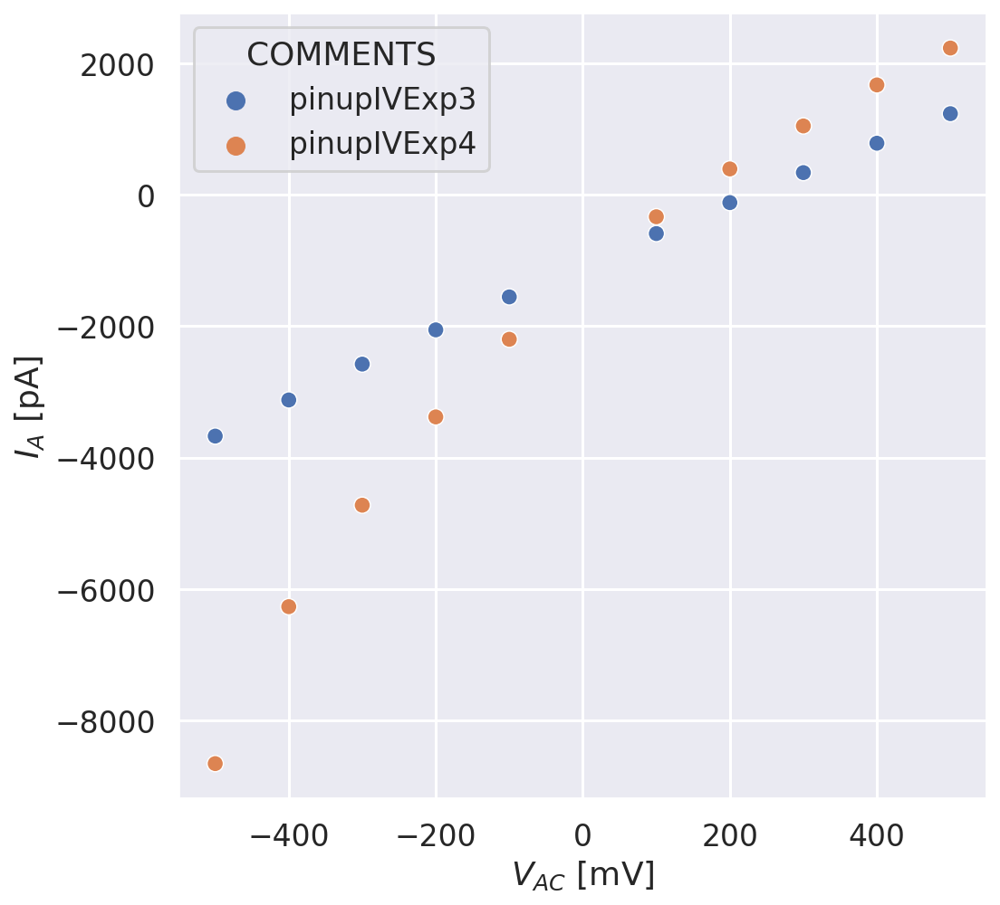

In [28]:
%matplotlib inline
sns.set(rc={'figure.figsize':(8,8)})
sns.set_style()
sns.set_context("talk")
sns.scatterplot(x='VAC',y='I_mean',data=statsDF.loc[statsDF['COMMENTS'].str.contains('pinupIVExp[3|4]')], hue='COMMENTS')
plt.xlabel('$V_{AC}$ [mV]')
plt.ylabel('$I_{A}$ [pA]')

IV3 was taken at 1800 Saturday, IV4 was at 0300 Sunday.

In [13]:
df['EVENTCHARGE'] = df['EVENTDWELLTIME'] * df['EVENTDEPTH'] * 1.0e-12 * 1.0e-6 / 1.6e-19

In [17]:
df

,Unnamed: 0,EVENTTHRESHOLD,EVENTTRIGGERVALUE,EVENTTYPE,EVENTSTARTIDX,EVENTSTOPIDX,EVENTBASELINE,EVENTDWELLTIME,EVENTDEPTH,EVENTSTD,...,A_RISINGEDGE,K_RISINGEDGE_stretchted,K_RISINGEDGE_stretchted_1sigma,K_RISINGEDGE_stretchted_rchi,A_RISINGEDGE_stretchted,ALPHA_RISINGEDGE_stretchted,K_OFF_stretched_apparent,K_ON_stretched_apparent,K_RISINGEDGE_stretched_apparent,EVENTCHARGE
0,0,2375.333862,1330,down,895907,896164,4261.105957,616.8,-16424.845257,3751.533726,...,18.193885,1.089947,0.391620,6.342210,26.404324,0.230270,296.336983,0.031328,0.026761,-6.331778e+07
1,1,2375.333862,22490,up,896166,897971,4261.115234,4332.0,2569.986151,2594.497359,...,18.193885,1.089947,0.391620,6.342210,26.404324,0.230270,296.336983,0.031328,0.026761,6.958238e+07
2,2,2375.333862,-1571,down,921752,922002,4250.791016,600.0,-16424.599016,3778.243875,...,18.193885,1.089947,0.391620,6.342210,26.404324,0.230270,296.336983,0.031328,0.026761,-6.159225e+07
3,3,2375.333862,13990,up,922004,923799,4250.605957,4308.0,2611.846411,2550.068019,...,18.193885,1.089947,0.391620,6.342210,26.404324,0.230270,296.336983,0.031328,0.026761,7.032396e+07
4,4,2375.333862,766,down,1616387,1616404,3968.743896,40.8,-19431.979191,4627.352102,...,18.193885,1.089947,0.391620,6.342210,26.404324,0.230270,296.336983,0.031328,0.026761,-4.955155e+06
5,5,2375.333862,17034,up,1616406,1616449,3968.674316,103.2,5505.837312,5375.798832,...,18.193885,1.089947,0.391620,6.342210,26.404324,0.230270,296.336983,0.031328,0.026761,3.551265e+06
6,6,2375.333862,5566,up,6219204,6246284,3102.552490,64992.0,10780.519002,4829.744627,...,18.193885,1.089947,0.391620,6.342210,26.404324,0.230270,296.336983,0.031328,0.026761,4.379047e+09
7,7,2375.333862,6399,up,9741846,9742402,2778.604248,1334.4,1472.674529,1868.964528,...,18.193885,1.089947,0.391620,6.342210,26.404324,0.230270,296.336983,0.031328,0.026761,1.228211e+07
8,8,2375.333862,-1031,down,12606606,12606860,2619.531982,609.6,-14964.854817,3997.960894,...,18.193885,1.089947,0.391620,6.342210,26.404324,0.230270,296.336983,0.031328,0.026761,-5.701610e+07
9,9,2375.333862,8326,up,12606865,12608896,2619.336426,4874.4,2323.876770,2559.217799,...,18.193885,1.089947,0.391620,6.342210,26.404324,0.230270,296.336983,0.031328,0.026761,7.079691e+07


In [19]:
df[((df['VAG_y'] <=-261)&(df['EVENTTYPE'] =='down'))&(df['VAG_y'] >=-300.525122)][['VAG_y','EVENTCHARGE']]

,VAG_y,EVENTCHARGE
112,-261.525122,-7.910877e+07
114,-261.525122,-7.990599e+07
116,-261.525122,-7.871525e+07
118,-261.525122,-7.526114e+07
120,-261.525122,-9.906870e+07
122,-261.525122,-2.975691e+06
124,-261.525122,-9.809114e+07
126,-261.525122,-6.892367e+07
128,-261.525122,-6.713853e+07
130,-261.525122,-7.634433e+07


<AxesSubplot:xlabel='EVENTCHARGE', ylabel='Count'>

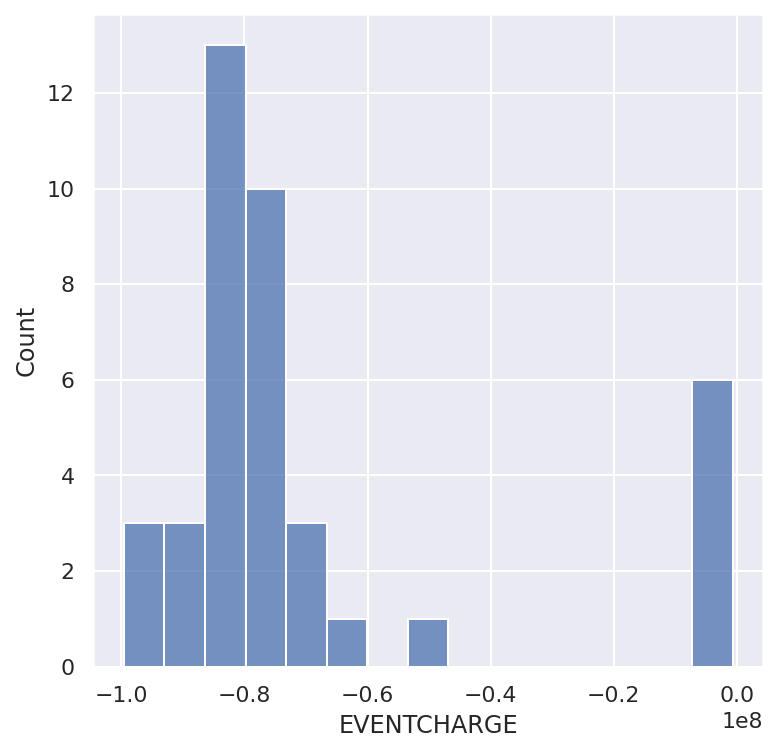

In [23]:
sns.histplot(df[((df['EVENTTYPE'] =='down')&(df['VAG_y'] <=-261)&(df['VAG_y'] >=-300.525122))]['EVENTCHARGE'])

<AxesSubplot:xlabel='EVENTCHARGE', ylabel='Count'>

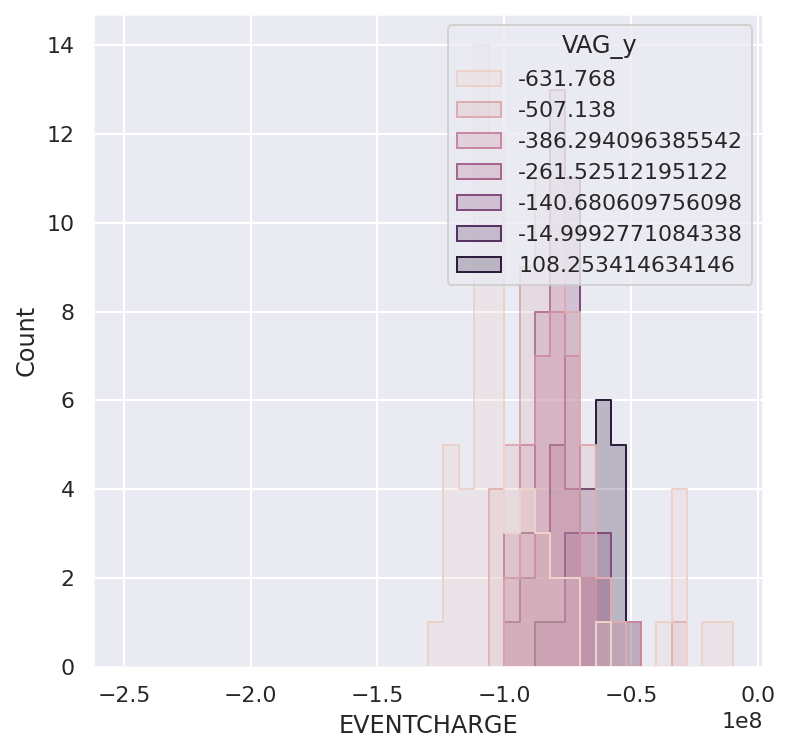

In [30]:
sns.histplot(x='EVENTCHARGE', hue ='VAG_y',  data = df[((df['EVENTTYPE'] =='down')&(df['VAG_y'] >=-700))], element="step", binrange = [-2.5e8,-1e7])

<AxesSubplot:xlabel='EVENTCHARGE', ylabel='Count'>

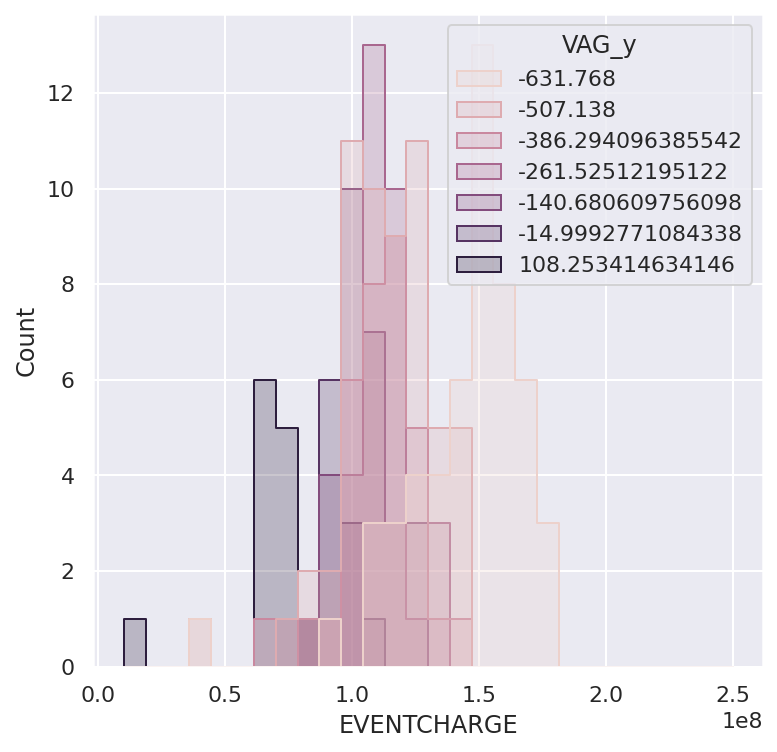

In [29]:
sns.histplot(x='EVENTCHARGE', hue ='VAG_y',  data = df[((df['EVENTTYPE'] =='up')&(df['VAG_y'] >=-700))], element="step", binrange = [1e7,2.5e8])

### 1kBs, -900mV bias, logging 1 - run again with different end of event code - w/o option --HistBaseline

github code base #idealTracePickle fcb7b092

In [87]:
resultsPath = Path('/proj/schnellstapel/jakobuchheim/superLatticeData/20210602A_pd-1kbs--900-1_newEoE_woHistBaseline_idealtrace/')
files_for_frame = sorted(resultsPath.rglob('./dataframe_atruntime_*.csv'))
# import all data frames in folder
DFlist = []
for fileN in files_for_frame:
    DFlist.append(pd.read_csv(fileN))
statsDF = pd.concat(DFlist, ignore_index = True)
statsDF = statsDF.rename(columns = {'Unnamed: 0':'EXPERIMENTNAME'})

In [88]:
resultsPath = Path('/proj/schnellstapel/jakobuchheim/superLatticeData/20210602A_pd-1kbs--900-1_newEoE_woHistBaseline_idealtrace/')
files_for_frame = sorted(resultsPath.rglob('./*/*events.csv'))
# import all data frames in folder
DFlist = []
for fileN in files_for_frame:
    tmp = pd.read_csv(fileN)
    tmp['EXPERIMENTNAME'] = str(fileN.name).split('_events')[0]
    DFlist.append(tmp)
eventsDF = pd.concat(DFlist, ignore_index = True)

In [89]:
df = pd.merge(eventsDF, statsDF, how = 'left', on = ["EXPERIMENTNAME"])

In [90]:
a = df.loc[df['EVENTTYPE'] == 'down'].groupby('EXPERIMENTNAME')[['NUMBEROFEVENTS_x']].count()

In [94]:
df_m900mV=df.loc[df['EVENTTYPE'] == 'down'].groupby('EXPERIMENTNAME').aggregate(
    {'NUMBEROFEVENTS_x': np.count_nonzero,'TOTALTRACETIME_x': np.mean,'EVENTDEPTH': np.mean,'EVENTDWELLTIME': np.median,'VAG_y': np.nanmean,'VGC': np.nanmean})
df_m900mV['EVENTRATE']=df_m900mV['NUMBEROFEVENTS_x'] / df_m900mV['TOTALTRACETIME_x'] * 1e6
display(df_m900mV)


,NUMBEROFEVENTS_x,TOTALTRACETIME_x,EVENTDEPTH,EVENTDWELLTIME,VAG_y,VGC,EVENTRATE
EXPERIMENTNAME,,,,,,,
20210624-181005_20210602A_1MKCl_pindown1kbpdsDNAfrontsweepmoregate_-900_mV_0_-900mV,11,1.128500e+08,-16042.540693,520.8,108.653423,-1008.653423,0.097475
20210624-181005_20210602A_1MKCl_pindown1kbpdsDNAfrontsweepmoregate_-900_mV_1_-900mV,19,1.140500e+08,-12967.267500,931.2,-27.711071,-872.288929,0.166594
20210624-181005_20210602A_1MKCl_pindown1kbpdsDNAfrontsweepmoregate_-900_mV_2_-900mV,30,1.137320e+08,-12076.212541,1122.0,-163.701593,-736.298407,0.263778
20210624-181005_20210602A_1MKCl_pindown1kbpdsDNAfrontsweepmoregate_-900_mV_3_-900mV,31,1.140890e+08,-11778.464496,1137.6,-298.866372,-601.133628,0.271718
20210624-181005_20210602A_1MKCl_pindown1kbpdsDNAfrontsweepmoregate_-900_mV_4_-900mV,48,1.138810e+08,-11754.972163,1108.8,-436.065268,-463.934732,0.421493
20210624-181005_20210602A_1MKCl_pindown1kbpdsDNAfrontsweepmoregate_-900_mV_5_-900mV,47,1.137460e+08,-11279.278772,1248.0,-573.520619,-326.479381,0.413201
20210624-181005_20210602A_1MKCl_pindown1kbpdsDNAfrontsweepmoregate_-900_mV_6_-900mV,77,1.141436e+08,-8723.968000,1946.4,-710.975000,NaN,0.674589
20210624-181005_20210602A_1MKCl_pindown1kbpdsDNAfrontsweepmoregate_-900_mV_7_-900mV,1237,1.139326e+08,-4821.690776,86.4,-848.430300,NaN,10.857297


In [99]:
tmp = df.loc[((df['EVENTDWELLTIME'] >1e2) &(df['EVENTTYPE'] =='down') &~((df['VAG_y']<-750)&(df['EVENTDEPTH']>-7500)))]

df_m900mV2=tmp.loc[df['EVENTTYPE'] == 'down'].groupby('EXPERIMENTNAME').aggregate(
    {'NUMBEROFEVENTS_x': np.count_nonzero,'TOTALTRACETIME_x': np.mean,'EVENTDEPTH': np.mean,'EVENTDWELLTIME': np.mean,'VAG_y': np.nanmean,'VGC': np.nanmean})
df_m900mV2['EVENTRATE']=df_m900mV2['NUMBEROFEVENTS_x'] / df_m900mV2['TOTALTRACETIME_x'] * 1e6
display(df_m900mV2)

,NUMBEROFEVENTS_x,TOTALTRACETIME_x,EVENTDEPTH,EVENTDWELLTIME,VAG_y,VGC,EVENTRATE
EXPERIMENTNAME,,,,,,,
20210624-181005_20210602A_1MKCl_pindown1kbpdsDNAfrontsweepmoregate_-900_mV_0_-900mV,8,112849953.6,-14954.231571,525.300000,108.653423,-1008.653423,0.070891
20210624-181005_20210602A_1MKCl_pindown1kbpdsDNAfrontsweepmoregate_-900_mV_1_-900mV,19,114050011.2,-12967.267500,878.905263,-27.711071,-872.288929,0.166594
20210624-181005_20210602A_1MKCl_pindown1kbpdsDNAfrontsweepmoregate_-900_mV_2_-900mV,30,113732016.0,-12076.212541,1092.080000,-163.701593,-736.298407,0.263778
20210624-181005_20210602A_1MKCl_pindown1kbpdsDNAfrontsweepmoregate_-900_mV_3_-900mV,30,114089011.2,-11857.915955,1134.720000,-298.866372,-601.133628,0.262953
20210624-181005_20210602A_1MKCl_pindown1kbpdsDNAfrontsweepmoregate_-900_mV_4_-900mV,44,113881015.2,-11731.010497,1130.345455,-436.065268,-463.934732,0.386368
20210624-181005_20210602A_1MKCl_pindown1kbpdsDNAfrontsweepmoregate_-900_mV_5_-900mV,47,113746010.4,-11279.278772,1233.140426,-573.520619,-326.479381,0.413201
20210624-181005_20210602A_1MKCl_pindown1kbpdsDNAfrontsweepmoregate_-900_mV_6_-900mV,73,114143599.2,-8672.873307,7808.547945,-710.975000,NaN,0.639545


Text(0.5, 1.0, 'event rate')

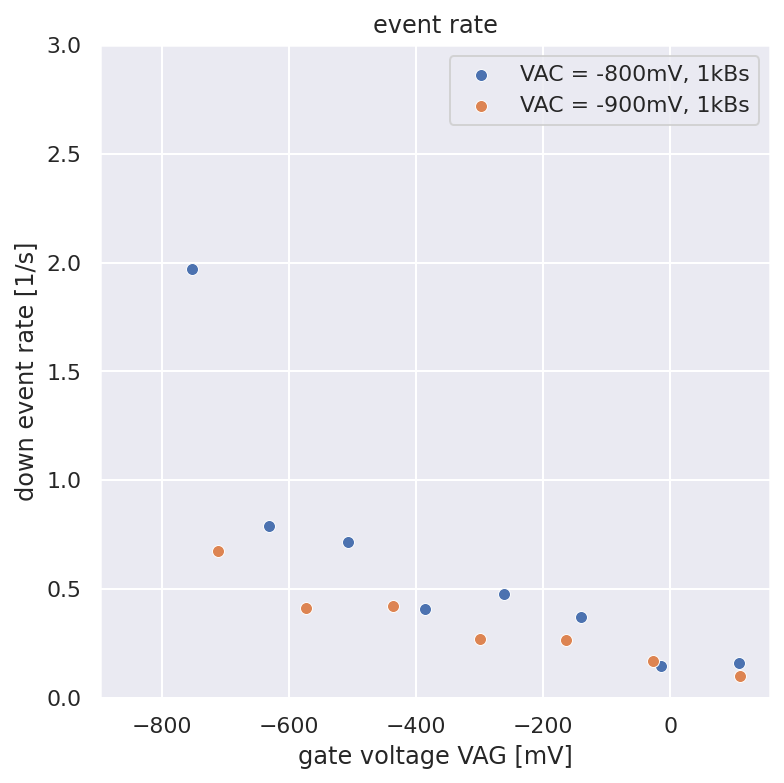

In [100]:
sns.scatterplot(x='VAG_y', y='EVENTRATE', data=df_m800mV, label='VAC = -800mV, 1kBs')
sns.scatterplot(x='VAG_y', y='EVENTRATE', data=df_m900mV, label='VAC = -900mV, 1kBs')
plt.ylim([0,3])
plt.ylabel('down event rate [1/s]')
plt.xlabel('gate voltage VAG [mV]')
plt.title('event rate')

Text(0.5, 1.0, 'median event dwell time')

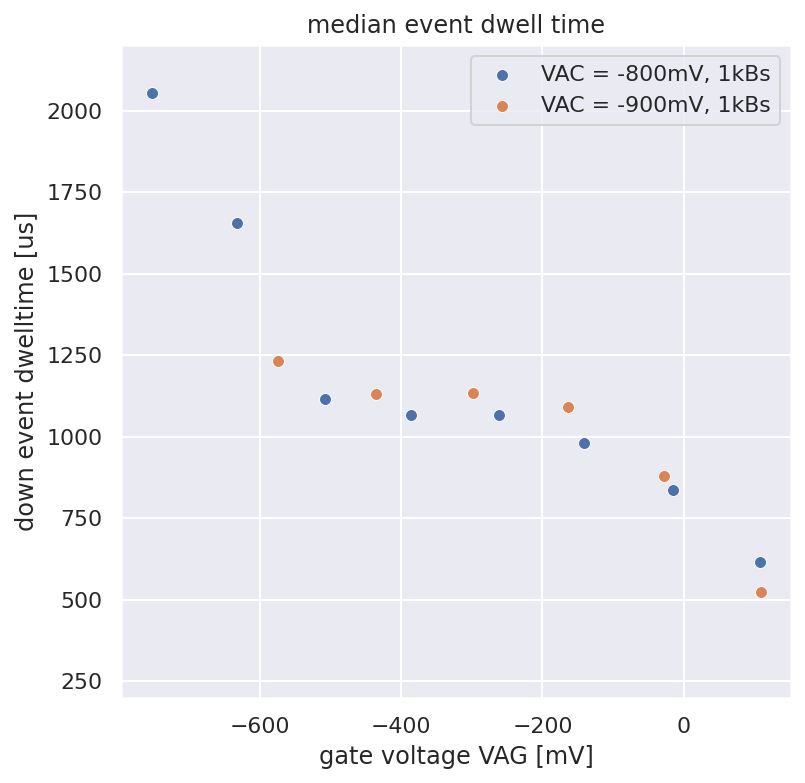

In [101]:
sns.scatterplot(x='VAG_y', y='EVENTDWELLTIME', data=df_m800mV, label='VAC = -800mV, 1kBs')
sns.scatterplot(x='VAG_y', y='EVENTDWELLTIME', data=df_m900mV2, label='VAC = -900mV, 1kBs')
plt.ylabel('down event dwelltime [us]')
plt.ylim([200,2200])
plt.xlabel('gate voltage VAG [mV]')
plt.title('median event dwell time')

In [324]:
df[['EVENTDWELLTIME','EVENTDEPTH', 'VAG_y']]

,EVENTDWELLTIME,EVENTDEPTH,VAG_y
0,6676.8,3843.191772,108.653423
1,4629.6,2651.158240,108.653423
2,36.0,-20063.382747,108.653423
3,81.6,5135.056239,108.653423
4,62318.4,5147.670813,108.653423
5,564.0,-15514.828692,108.653423
6,4154.4,2427.942022,108.653423
7,38.4,-18346.989258,108.653423
8,98.4,4360.761874,108.653423
9,525.6,-15368.125496,108.653423


(-17000.0, -1000.0)

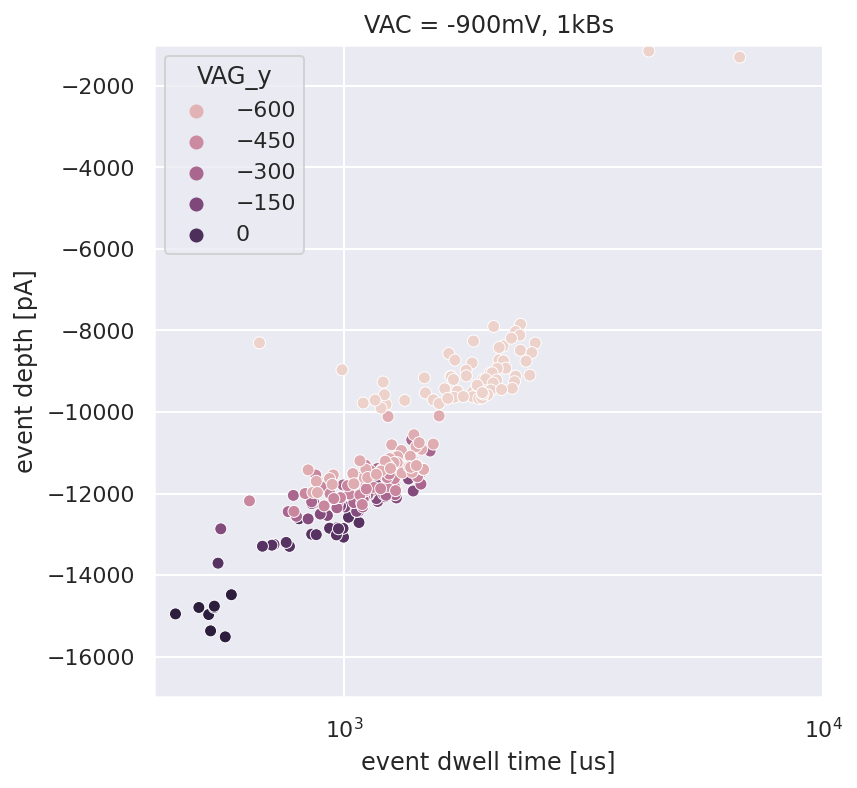

In [328]:
sns.set(rc={'figure.figsize':(6,6)})
sns.set_style()
p = sns.scatterplot(x = 'EVENTDWELLTIME', y = 'EVENTDEPTH', hue = 'VAG_y', data = df.loc[((df['EVENTDWELLTIME'] >1e2) &(df['EVENTTYPE'] =='down') &~((df['VAG_y']<-750)&(df['EVENTDEPTH']>-7500)))])
p.set(xscale="log")
plt.title('VAC = -900mV, 1kBs')
plt.xlabel('event dwell time [us]')
plt.ylabel('event depth [pA]')
plt.xlim([4e2,1e4])
plt.ylim([-1.700e4,-0.1e4])

### 10kBs, -700mV bias, logging 1 - run again with different end of event code - w/o option --HistBaseline

github code base #idealTracePickle fcb7b092

In [48]:
%mv /proj/jakobuchheim/Analysis/DataAndResults/results /proj/schnellstapel/jakobuchheim/superLatticeData/20210602A_pd-10kbs--700-1_newEoE_woHistBaseline_idealtrace/

In [121]:
resultsPath = Path('/proj/schnellstapel/jakobuchheim/superLatticeData/20210602A_pd-10kbs--700-1_newEoE_woHistBaseline_idealtrace/')
files_for_frame = sorted(resultsPath.rglob('./dataframe_atruntime_*.csv'))
# import all data frames in folder
DFlist = []
for fileN in files_for_frame:
    DFlist.append(pd.read_csv(fileN))
statsDF = pd.concat(DFlist, ignore_index = True)
statsDF = statsDF.rename(columns = {'Unnamed: 0':'EXPERIMENTNAME'})

In [122]:
resultsPath = Path('/proj/schnellstapel/jakobuchheim/superLatticeData/20210602A_pd-10kbs--700-1_newEoE_woHistBaseline_idealtrace/')
files_for_frame = sorted(resultsPath.rglob('./*/*events.csv'))
# import all data frames in folder
DFlist = []
for fileN in files_for_frame:
    tmp = pd.read_csv(fileN)
    tmp['EXPERIMENTNAME'] = str(fileN.name).split('_events')[0]
    DFlist.append(tmp)
eventsDF = pd.concat(DFlist, ignore_index = True)

In [123]:
df = pd.merge(eventsDF, statsDF, how = 'left', on = ["EXPERIMENTNAME"])

In [124]:
a = df.loc[df['EVENTTYPE'] == 'down'].groupby('EXPERIMENTNAME')[['NUMBEROFEVENTS_x']].count()

In [125]:
df.loc[df['EVENTTYPE'] == 'down'].groupby('EXPERIMENTNAME').aggregate({'NUMBEROFEVENTS_x': np.count_nonzero,'EVENTDEPTH': np.mean,'EVENTDWELLTIME': np.mean,'VAG_y': np.nanmean})

,NUMBEROFEVENTS_x,EVENTDEPTH,EVENTDWELLTIME,VAG_y
EXPERIMENTNAME,,,,
20210624-183957_20210602A_1MKCl_pindown10kbpdsDNAfrontsweepmoregate_-700_mV_0_-700mV,1,-1255.561007,849.600000,-140.284196
20210624-183957_20210602A_1MKCl_pindown10kbpdsDNAfrontsweepmoregate_-700_mV_2_-700mV,4,-13364.185555,591.000000,-237.599107
20210624-183957_20210602A_1MKCl_pindown10kbpdsDNAfrontsweepmoregate_-700_mV_5_-700mV,7,-12506.792861,721.714286,-386.222719
20210624-183957_20210602A_1MKCl_pindown10kbpdsDNAfrontsweepmoregate_-700_mV_6_-700mV,1,-4654.513014,208819.200000,-435.944554


### 10kBs, 700mV bias, logging 1 - run again with different end of event code - w/o option --HistBaseline

github code base #idealTracePickle fcb7b092

In [68]:
jupyter_auxilariy_functions.checkout('20210602A_pd-10kbs-700-1', LOC = '/proj/jakobuchheim/Analysis')
pythonCMD = '"python3  src/main.py -t $(THREADS) -f 100000 --filterType Bessel --instrumentType Chimera --findevents --kvalueanalysis --mineventdepth 1000 --PDF 6.0 --PDFreversal 0.5 --eventType both --passes 4 --avwindow 0.5 --plotidealevents 1.0 --picklesegment"'
jupyter_auxilariy_functions.batch_run(pythonCMD, NCPU = 8, MEM = 50000, LR = 8, QU='CH', LOC = '/proj/jakobuchheim/Analysis')

0

In [69]:
%mv /proj/jakobuchheim/Analysis/DataAndResults/results /proj/schnellstapel/jakobuchheim/superLatticeData/20210602A_pd-10kbs-700-1_newEoE_woHistBaseline_idealtrace/

### 10kBs, 1000mV bias, logging 1 - run again with different end of event code - w/o option --HistBaseline

github code base #idealTracePickle fcb7b092

In [71]:
jupyter_auxilariy_functions.checkout('20210602A_pd-10kbs-1000-1', LOC = '/proj/jakobuchheim/Analysis')
pythonCMD = '"python3  src/main.py -t $(THREADS) -f 100000 --filterType Bessel --instrumentType Chimera --findevents --kvalueanalysis --mineventdepth 1000 --PDF 6.0 --PDFreversal 0.5 --eventType both --passes 4 --avwindow 0.5 --plotidealevents 1.0 --picklesegment"'
jupyter_auxilariy_functions.batch_run(pythonCMD, NCPU = 8, MEM = 50000, LR = 8, QU='CH', LOC = '/proj/jakobuchheim/Analysis')

0

In [ ]:
%mv /proj/jakobuchheim/Analysis/DataAndResults/results /proj/schnellstapel/jakobuchheim/superLatticeData/20210602A_pd-10kbs-1000-1_newEoE_woHistBaseline_idealtrace/

### 10kBs, 500mV bias, logging 1 - w/o option --HistBaseline

github code base #idealTracePickle fcb7b092

THIS DOES NOT SLICE CORRECTLY!!!

### 1kBs, 800mV bias, logging 1 - run again with different end of event code - w/o option --HistBaseline

github code base #idealTracePickle fcb7b092

In [256]:
resultsPath = Path('/proj/schnellstapel/jakobuchheim/superLatticeData/20210602A_pd-1kbs--800-1_newEoE_woHistBaseline_idealtrace/')
files_for_frame = sorted(resultsPath.rglob('./dataframe_atruntime_*.csv'))
# import all data frames in folder
DFlist = []
for fileN in files_for_frame:
    DFlist.append(pd.read_csv(fileN))
statsDF = pd.concat(DFlist, ignore_index = True)
statsDF = statsDF.rename(columns = {'Unnamed: 0':'EXPERIMENTNAME'})

In [257]:
resultsPath = Path('/proj/schnellstapel/jakobuchheim/superLatticeData/20210602A_pd-1kbs--800-1_newEoE_woHistBaseline_idealtrace/')
files_for_frame = sorted(resultsPath.rglob('./*/*events.csv'))
# import all data frames in folder
DFlist = []
for fileN in files_for_frame:
    tmp = pd.read_csv(fileN)
    tmp['EXPERIMENTNAME'] = str(fileN.name).split('_events')[0]
    DFlist.append(tmp)
eventsDF = pd.concat(DFlist, ignore_index = True)

In [258]:
df = pd.merge(eventsDF, statsDF, how = 'left', on = ["EXPERIMENTNAME"])

In [259]:
a = df.loc[df['EVENTTYPE'] == 'down'].groupby('EXPERIMENTNAME')[['NUMBEROFEVENTS_x']].count()

In [260]:
df_m800mV1 = df.loc[df['EVENTTYPE'] == 'down'].groupby('EXPERIMENTNAME').aggregate(
    {'NUMBEROFEVENTS_x': np.count_nonzero,'TOTALTRACETIME_x': np.mean,'EVENTDEPTH': np.mean,'EVENTDWELLTIME': np.median,'VAG_y': np.nanmean,'VGC': np.nanmean})
df_m800mV1['EVENTRATE']=df_m800mV1['NUMBEROFEVENTS_x'] / df_m800mV1['TOTALTRACETIME_x'] * 1e6
display(df_m800mV1)

,NUMBEROFEVENTS_x,TOTALTRACETIME_x,EVENTDEPTH,EVENTDWELLTIME,VAG_y,VGC,EVENTRATE
EXPERIMENTNAME,,,,,,,
20210624-174211_20210602A_1MKCl_pindown1kbpdsDNAfrontsweep_-800_mV_0_-800mV,41,82659244.8,-1273.707380,36.0,109.181605,-909.181605,0.496012
20210624-174211_20210602A_1MKCl_pindown1kbpdsDNAfrontsweep_-800_mV_5_-800mV,21,83642316.0,-1875.715797,16408.8,-715.770488,-84.229512,0.251069


(0.0, 5.0)

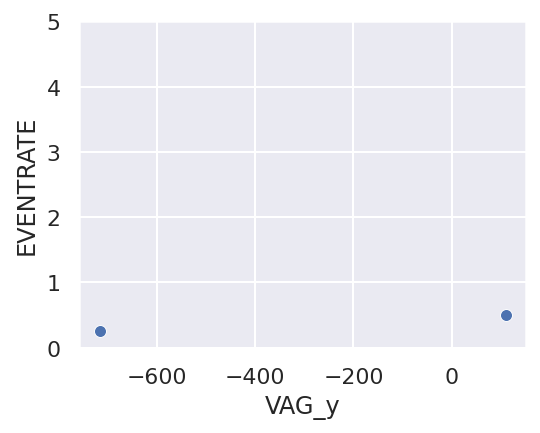

In [264]:
sns.scatterplot(x='VAG_y', y='EVENTRATE', data=df_m800mV1)
plt.ylim([0,5])

<AxesSubplot:xlabel='VAG_y', ylabel='EVENTDWELLTIME'>

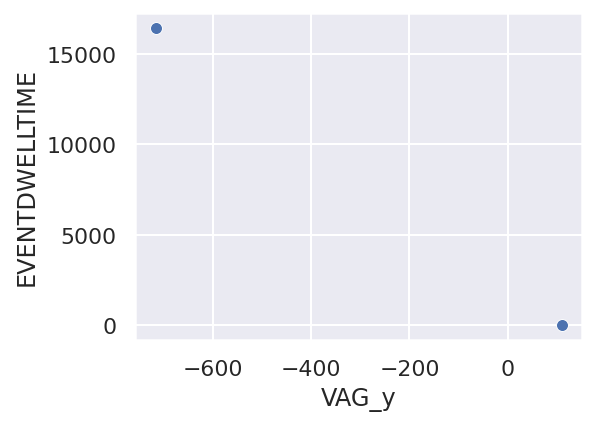

In [262]:
sns.scatterplot(x='VAG_y', y='EVENTDWELLTIME', data=df_m800mV1)

### Raw data inspection

In [4]:
    rawdata = np.fromfile('/proj/schnellstapel/flat_data_pool/20210623/gatesweepwithDNA-800mV_2/'\
                      '20210602A_1MKCl_pindown1kbpdsDNAfrontsweepmoregate_-800_mV_20210624_180756.log'
                      , dtype=np.uint16)
bitmask = np.uint16((2 ** 16 - 1) - (2 ** (16 - 14) - 1))
logdata = np.bitwise_and(rawdata, bitmask)

In [5]:
from sys import getsizeof
chLen = 10485760
logData = np.empty(chLen * 2, dtype="int16")
getsizeof(logData)

41943144

In [6]:
logData.nbytes/10**6

41.94304

In [7]:
rawdata.nbytes/10**6

20.97152

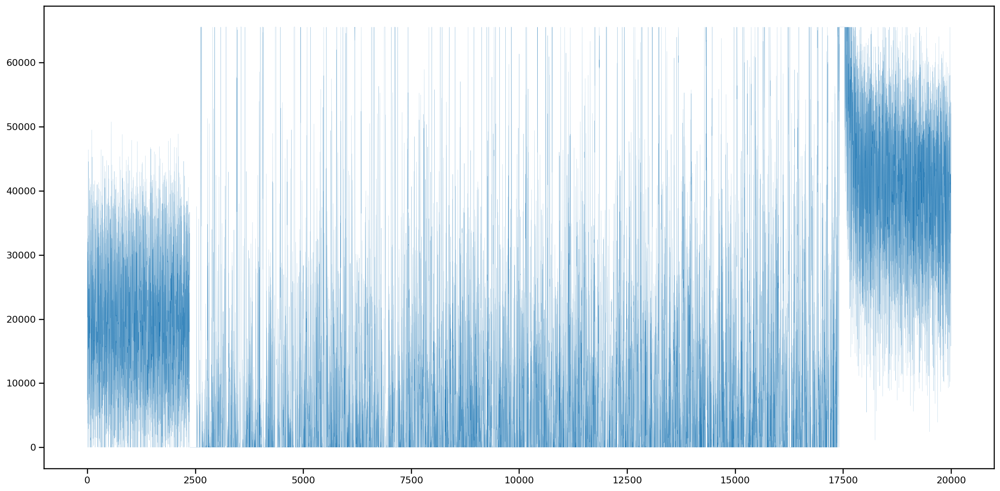

In [8]:
plt.figure(figsize=[20,10])
plt.plot(logdata[4145000:4165000],linewidth = 0.1)

<Figure size 1440x720 with 0 Axes>

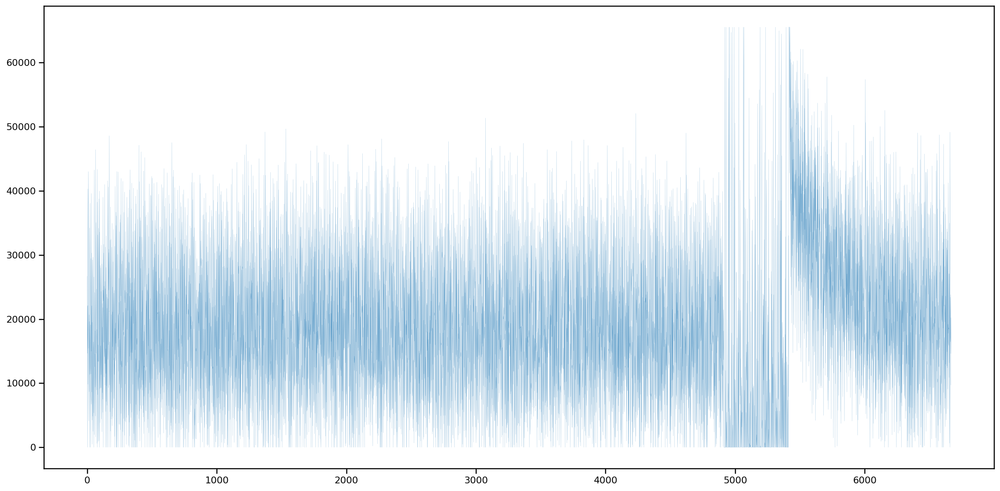

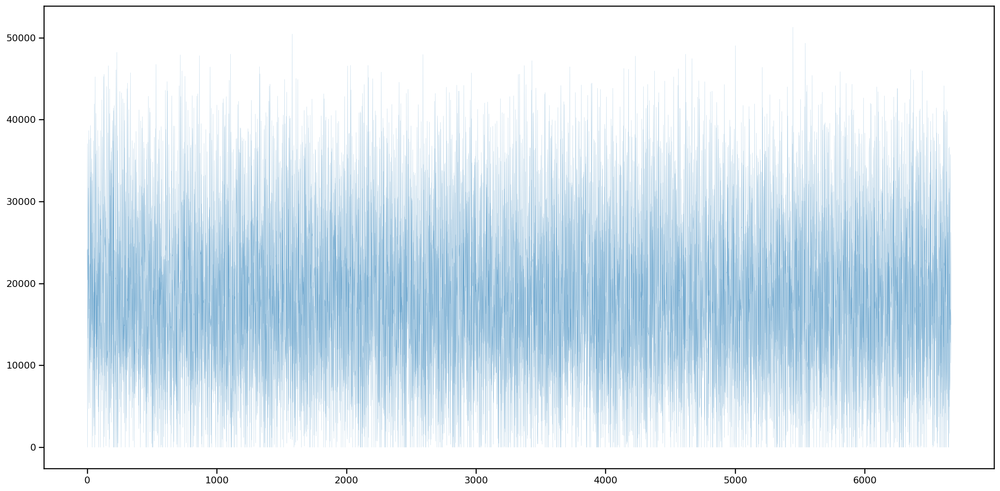

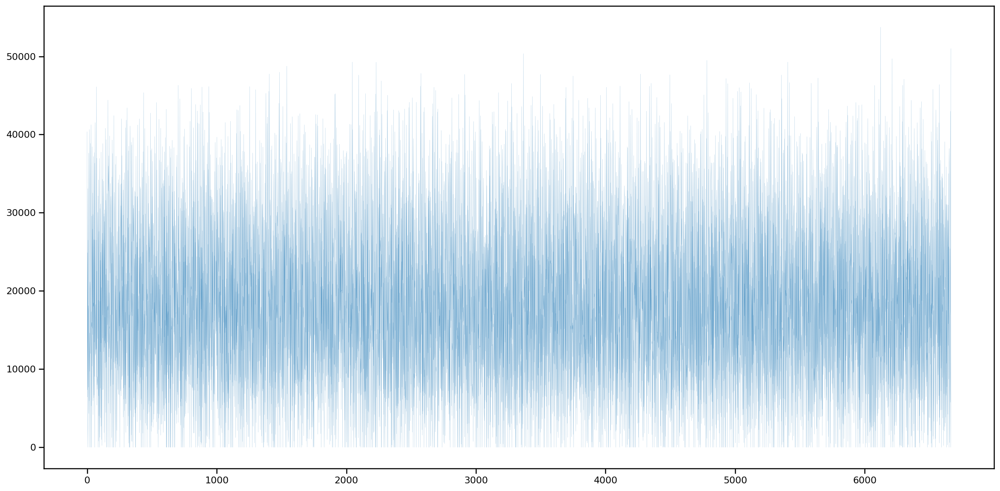

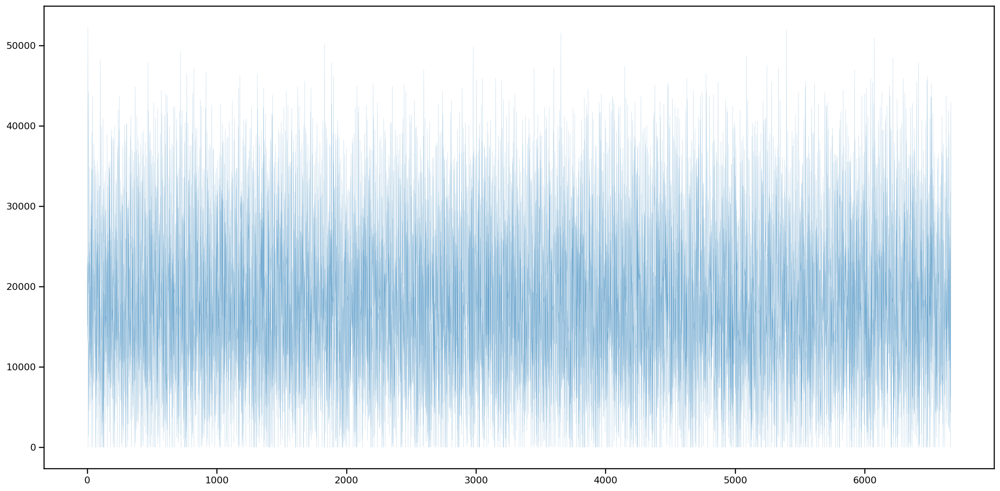

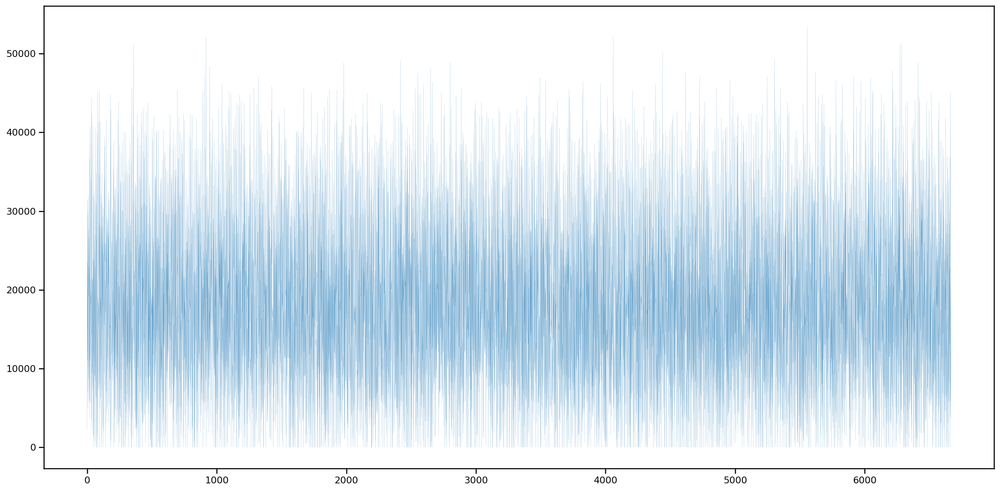

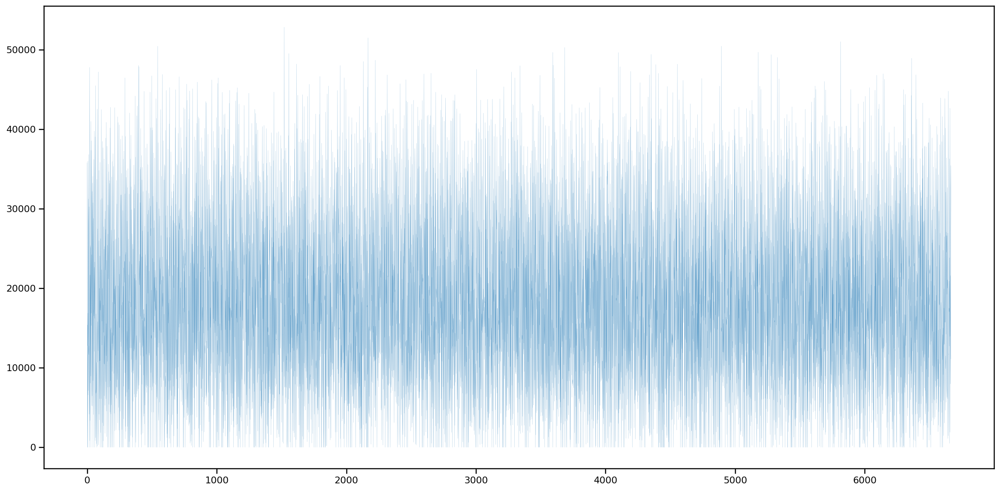

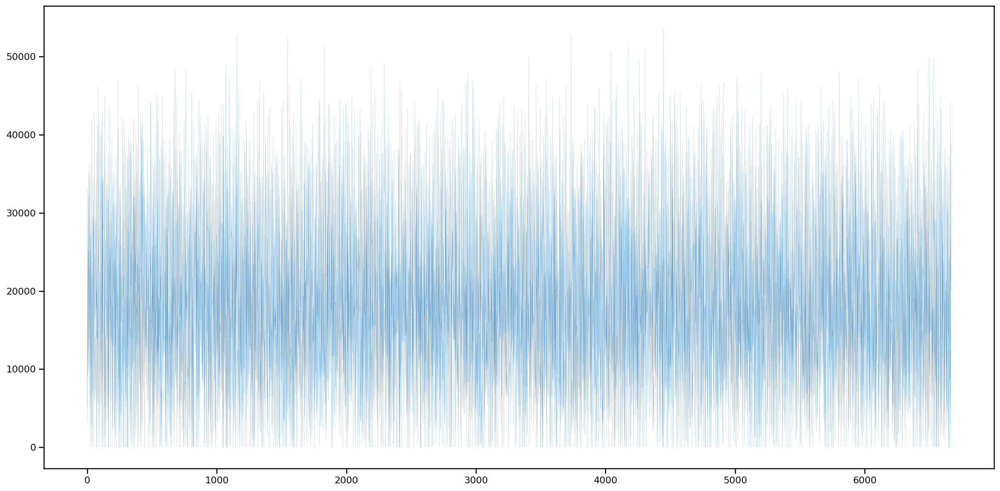

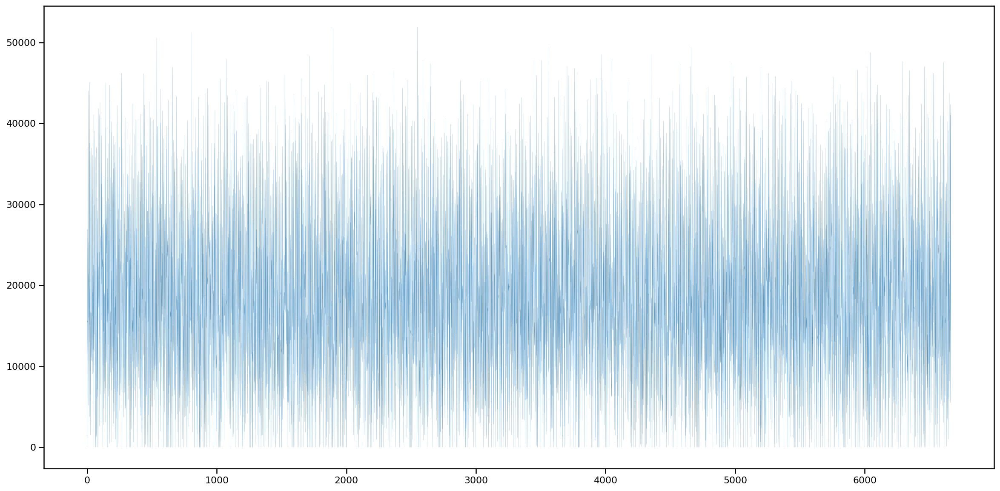

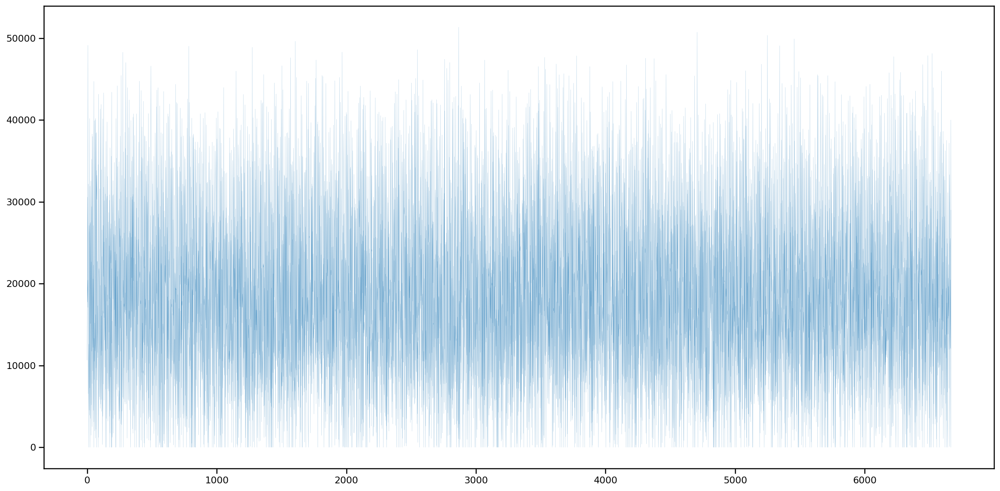

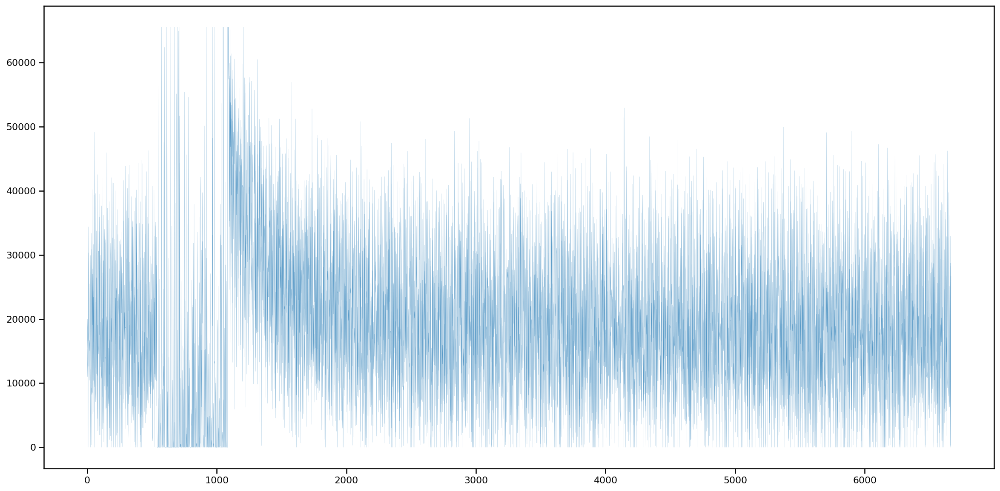

In [9]:
plt.figure(figsize=[20,10])
mult=9
for mult in range(20,30):#len(logdata) // 20000):
    plt.figure(figsize=[20,10])
    plt.plot(logdata[200000*mult:200000*(mult+1):30],linewidth = 0.1)
    plt.show()

# grant update

## Run code and load data

### IV - pinup

In [388]:
jupyter_auxilariy_functions.make_branch('20210602A_IV_quick', 
                    ['/proj/schnellstapel/flat_data_pool/20210623/IV'], 
                    LOC = '/proj/jakobuchheim/Repositories')

0

In [389]:
jupyter_auxilariy_functions.checkout('20210602A_IV_quick', LOC = '/proj/jakobuchheim/Repositories')

0

specify python analysis cmd as string

In [391]:
pythonCMD = '"python3  src/main.py -t $(THREADS) -f 25000 --segplot --filterType Bessel --instrumentType Chimera --picklesegment"'
jupyter_auxilariy_functions.batch_run(pythonCMD, NCPU = 23, MEM = 50000, LR = 8, QU='CH', LOC = '/proj/jakobuchheim/Repositories')

0

In [395]:
%mv /proj/jakobuchheim/Repositories/DataAndResults/results /proj/schnellstapel/jakobuchheim/superLatticeData/20210602A_IV_quick/

In [511]:
resultsPath = Path('/proj/schnellstapel/jakobuchheim/superLatticeData/20210602A_IV_quick')
files_for_frame = sorted(resultsPath.rglob('./dataframe_atruntime_*.csv'))
# import all data frames in folder
DFlist = []
for fileN in files_for_frame:
    DFlist.append(pd.read_csv(fileN))
statsDF = pd.concat(DFlist, ignore_index = True)
statsDF = statsDF.rename(columns = {'Unnamed: 0':'EXPERIMENTNAME'})

In [512]:
statsDF

,EXPERIMENTNAME,exp_name,timestamp,slice_i,SAMPLE,COMMENTS,conc,VA,electrolyte,VAC,...,I2NOISE-1,I2NOISE0,I2NOISE1,I2NOISE2,unit,BENCHVUE,otherelectrolyte,otherconc,TOTALTIME,VGC
0,20210624-154211_20210602A_1MKCl_pinupafteruncl...,20210602A_1MKCl_pinupafterunclogIVExp_-100_mV,2021-06-24 15:42:11.863002,0,20210602A,pinupafterunclogIVExp,1.0,NaN,KCl,-100,...,NaN,NaN,NaN,NaN,pA,NaN,NaN,0.0,5.0,NaN
1,20210624-154118_20210602A_1MKCl_pinupafteruncl...,20210602A_1MKCl_pinupafterunclogIVExp_100_mV,2021-06-24 15:41:18.686002,0,20210602A,pinupafterunclogIVExp,1.0,NaN,KCl,100,...,NaN,NaN,NaN,NaN,pA,NaN,NaN,0.0,5.0,NaN
2,20210624-154049_20210602A_1MKCl_pinupafteruncl...,20210602A_1MKCl_pinupafterunclogIVExp_400_mV,2021-06-24 15:40:49.754998,0,20210602A,pinupafterunclogIVExp,1.0,NaN,KCl,400,...,NaN,NaN,NaN,NaN,pA,NaN,NaN,0.0,5.0,NaN
3,20210624-154057_20210602A_1MKCl_pinupafteruncl...,20210602A_1MKCl_pinupafterunclogIVExp_300_mV,2021-06-24 15:40:57.963996,0,20210602A,pinupafterunclogIVExp,1.0,NaN,KCl,300,...,NaN,NaN,NaN,NaN,pA,NaN,NaN,0.0,7.5,NaN
4,20210624-154225_20210602A_1MKCl_pinupafteruncl...,20210602A_1MKCl_pinupafterunclogIVExp_-200_mV,2021-06-24 15:42:25.407004,0,20210602A,pinupafterunclogIVExp,1.0,NaN,KCl,-200,...,NaN,NaN,NaN,NaN,pA,NaN,NaN,0.0,7.5,NaN
5,20210624-154339_20210602A_1MKCl_pinupafteruncl...,20210602A_1MKCl_pinupafterunclogIVExp_-500_mV,2021-06-24 15:43:39.741001,0,20210602A,pinupafterunclogIVExp,1.0,NaN,KCl,-500,...,NaN,NaN,NaN,NaN,pA,NaN,NaN,0.0,7.5,NaN
6,20210624-154329_20210602A_1MKCl_pinupafteruncl...,20210602A_1MKCl_pinupafterunclogIVExp_-400_mV,2021-06-24 15:43:29.005995,0,20210602A,pinupafterunclogIVExp,1.0,NaN,KCl,-400,...,NaN,NaN,NaN,NaN,pA,NaN,NaN,0.0,7.5,NaN
7,20210624-154038_20210602A_1MKCl_pinupafteruncl...,20210602A_1MKCl_pinupafterunclogIVExp_500_mV,2021-06-24 15:40:38.642999,0,20210602A,pinupafterunclogIVExp,1.0,NaN,KCl,500,...,NaN,NaN,NaN,NaN,pA,NaN,NaN,0.0,7.5,NaN
8,20210624-154106_20210602A_1MKCl_pinupafteruncl...,20210602A_1MKCl_pinupafterunclogIVExp_200_mV,2021-06-24 15:41:06.880997,0,20210602A,pinupafterunclogIVExp,1.0,NaN,KCl,200,...,NaN,NaN,NaN,NaN,pA,NaN,NaN,0.0,7.5,NaN
9,20210624-154308_20210602A_1MKCl_pinupafteruncl...,20210602A_1MKCl_pinupafterunclogIVExp_-300_mV,2021-06-24 15:43:08.284995,0,20210602A,pinupafterunclogIVExp,1.0,NaN,KCl,-300,...,NaN,NaN,NaN,NaN,pA,NaN,NaN,0.0,10.0,NaN


Text(0, 0.5, 'pore current [pA]')

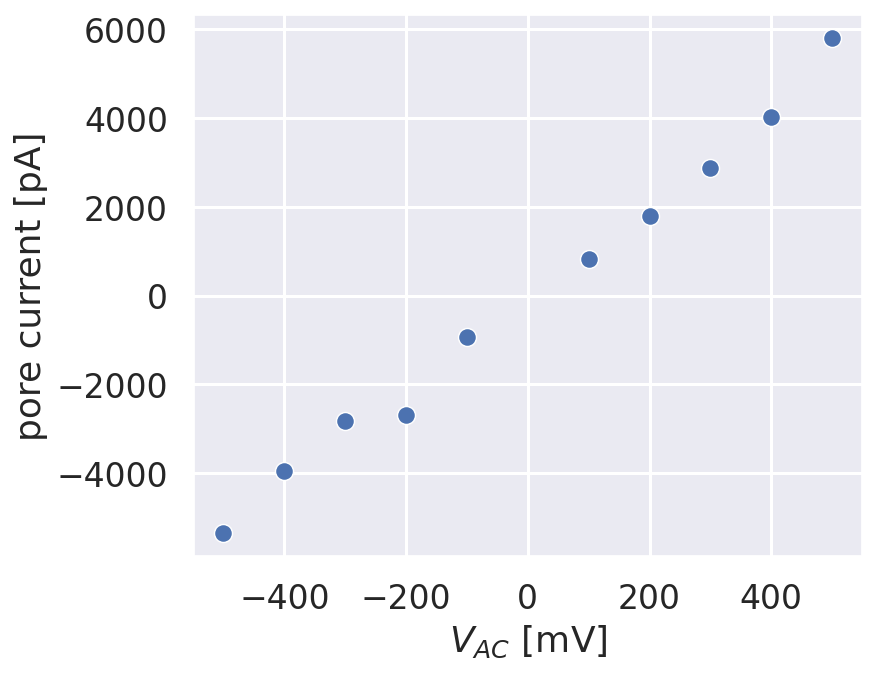

In [513]:
%matplotlib inline
sns.set(rc={'figure.figsize':(6,5)})
sns.set_style()
sns.set_context("talk")
sns.scatterplot(x='VAC',y='I_mean',data=statsDF.loc[statsDF['COMMENTS'].str.contains('after')])
# plt.errorbar(statsDF.loc[statsDF['COMMENTS'].str.contains('after')]['VAC'],statsDF.loc[statsDF['COMMENTS'].str.contains('after')]['I_mean'],
#                yerr=statsDF.loc[statsDF['COMMENTS'].str.contains('after')]['I_std'],
#                             elinewidth=2, # width of error bar line
#                             ecolor=t[1],    # color of error bar
#                             capsize=5,     # cap length for error bar
#                             capthick=2,    # cap thickness for error bar
#                             fmt='none',
#                             zorder=50,
#                             alpha=0.5)
plt.xlabel('$V_{AC}$ [mV]')
plt.ylabel('pore current [pA]')

In [ ]:
statsDF['I_mean']

### pindown all IV

In [415]:
%%bash
find /proj/boyan/flat_data_pool/20210623/sorted_data/20210602A/pindown -type d -print  

/proj/boyan/flat_data_pool/20210623/sorted_data/20210602A/pindown
/proj/boyan/flat_data_pool/20210623/sorted_data/20210602A/pindown/pindown3gatesweep_500mV
/proj/boyan/flat_data_pool/20210623/sorted_data/20210602A/pindown/pindown6gatesweep_300mV
/proj/boyan/flat_data_pool/20210623/sorted_data/20210602A/pindown/pindown4gatesweep_500mV
/proj/boyan/flat_data_pool/20210623/sorted_data/20210602A/pindown/10kbpdsDNAfrontsweep_500mV
/proj/boyan/flat_data_pool/20210623/sorted_data/20210602A/pindown/1kbpdsDNAfrontsweepagain_-800mV
/proj/boyan/flat_data_pool/20210623/sorted_data/20210602A/pindown/10kbpdsDNAfrontsweep_-1000mV
/proj/boyan/flat_data_pool/20210623/sorted_data/20210602A/pindown/1kbpdsDNAfrontsweep_-800mV
/proj/boyan/flat_data_pool/20210623/sorted_data/20210602A/pindown/10kbpdsDNAfrontsweep_700mV
/proj/boyan/flat_data_pool/20210623/sorted_data/20210602A/pindown/pindowngatesweep_500mV
/proj/boyan/flat_data_pool/20210623/sorted_data/20210602A/pindown/1kbpdsDNAfrontsweep_-700mV
/proj/boya

In [486]:
jupyter_auxilariy_functions.make_branch('20210602A_IV_pindown_all', 
                    ['/proj/boyan/flat_data_pool/20210623/sorted_data/20210602A/pindown/pindown3gatesweep_500mV',
                    '/proj/boyan/flat_data_pool/20210623/sorted_data/20210602A/pindown/pindown6gatesweep_300mV',
                    '/proj/boyan/flat_data_pool/20210623/sorted_data/20210602A/pindown/pindown6gatesweep_300mV',
                    '/proj/boyan/flat_data_pool/20210623/sorted_data/20210602A/pindown/pindowngatesweep_500mV',
                    '/proj/boyan/flat_data_pool/20210623/sorted_data/20210602A/pindown/pindown2gatesweep_500mV',
                    '/proj/boyan/flat_data_pool/20210623/sorted_data/20210602A/pindown/pindown7gatesweep_400mV',
                    '/proj/boyan/flat_data_pool/20210623/sorted_data/20210602A/pindown/pindown5gatesweep_200mV'], 
                    LOC = '/proj/jakobuchheim/Analysis')

0

In [487]:
jupyter_auxilariy_functions.checkout('20210602A_IV_pindow_all', LOC = '/proj/jakobuchheim/Analysis')
pythonCMD = '"python3  src/main.py -t $(THREADS) -f 25000 --expplot --segplot --filterType Bessel --instrumentType Chimera --picklesegment"'
jupyter_auxilariy_functions.batch_run(pythonCMD, NCPU = 23, MEM = 150000, LR = 8, QU='CH', LOC = '/proj/jakobuchheim/Analysis')

0

In [501]:
%mv /proj/jakobuchheim/Analysis/DataAndResults/results /proj/schnellstapel/jakobuchheim/superLatticeData/20210602A_IV_pindown_all/

In [516]:
resultsPath = Path('/proj/schnellstapel/jakobuchheim/superLatticeData/20210602A_IV_pindown_all')
files_for_frame = sorted(resultsPath.rglob('./dataframe_atruntime_*.csv'))
# import all data frames in folder
DFlist = []
for fileN in files_for_frame:
    DFlist.append(pd.read_csv(fileN))
statsDF = pd.concat(DFlist, ignore_index = True)
statsDF = statsDF.rename(columns = {'Unnamed: 0':'EXPERIMENTNAME'})

In [517]:
statsDF

,EXPERIMENTNAME,exp_name,timestamp,slice_i,SAMPLE,COMMENTS,conc,VA,electrolyte,VAC,...,I2NOISE-1,I2NOISE0,I2NOISE1,I2NOISE2,unit,BENCHVUE,otherelectrolyte,otherconc,TOTALTIME,VGC
0,20210623-191045_20210602A_1MKCl_pindown5gatesw...,20210602A_1MKCl_pindown5gatesweep_200_mV,2021-06-23 19:10:45.430996,2,20210602A,pindown5gatesweep,1.0,2350,KCl,200,...,NaN,NaN,NaN,NaN,pA,/proj/boyan/flat_data_pool/20210623/sorted_dat...,NaN,0.0,110.0,1.133333
1,20210623-184906_20210602A_1MKCl_pindown2gatesw...,20210602A_1MKCl_pindown2gatesweep_500_mV,2021-06-23 18:49:06.733997,7,20210602A,pindown2gatesweep,1.0,2350,KCl,500,...,NaN,NaN,NaN,NaN,pA,/proj/boyan/flat_data_pool/20210623/sorted_dat...,NaN,0.0,115.0,362.710000
2,20210623-191045_20210602A_1MKCl_pindown5gatesw...,20210602A_1MKCl_pindown5gatesweep_200_mV,2021-06-23 19:10:45.430996,1,20210602A,pindown5gatesweep,1.0,2350,KCl,200,...,NaN,NaN,NaN,NaN,pA,/proj/boyan/flat_data_pool/20210623/sorted_dat...,NaN,0.0,110.0,-27.400000
3,20210623-184906_20210602A_1MKCl_pindown2gatesw...,20210602A_1MKCl_pindown2gatesweep_500_mV,2021-06-23 18:49:06.733997,4,20210602A,pindown2gatesweep,1.0,2350,KCl,500,...,NaN,NaN,NaN,NaN,pA,/proj/boyan/flat_data_pool/20210623/sorted_dat...,NaN,0.0,115.0,182.620000
4,20210623-191045_20210602A_1MKCl_pindown5gatesw...,20210602A_1MKCl_pindown5gatesweep_200_mV,2021-06-23 19:10:45.430996,7,20210602A,pindown5gatesweep,1.0,2350,KCl,200,...,NaN,NaN,NaN,NaN,pA,/proj/boyan/flat_data_pool/20210623/sorted_dat...,NaN,0.0,110.0,151.910000
5,20210623-191045_20210602A_1MKCl_pindown5gatesw...,20210602A_1MKCl_pindown5gatesweep_200_mV,2021-06-23 19:10:45.430996,9,20210602A,pindown5gatesweep,1.0,2350,KCl,200,...,NaN,NaN,NaN,NaN,pA,/proj/boyan/flat_data_pool/20210623/sorted_dat...,NaN,0.0,110.0,211.410000
6,20210623-184906_20210602A_1MKCl_pindown2gatesw...,20210602A_1MKCl_pindown2gatesweep_500_mV,2021-06-23 18:49:06.733997,1,20210602A,pindown2gatesweep,1.0,2350,KCl,500,...,NaN,NaN,NaN,NaN,pA,/proj/boyan/flat_data_pool/20210623/sorted_dat...,NaN,0.0,115.0,5.643333
7,20210623-191045_20210602A_1MKCl_pindown5gatesw...,20210602A_1MKCl_pindown5gatesweep_200_mV,2021-06-23 19:10:45.430996,8,20210602A,pindown5gatesweep,1.0,2350,KCl,200,...,NaN,NaN,NaN,NaN,pA,/proj/boyan/flat_data_pool/20210623/sorted_dat...,NaN,0.0,110.0,182.113333
8,20210623-191045_20210602A_1MKCl_pindown5gatesw...,20210602A_1MKCl_pindown5gatesweep_200_mV,2021-06-23 19:10:45.430996,0,20210602A,pindown5gatesweep,1.0,2350,KCl,200,...,NaN,NaN,NaN,NaN,pA,/proj/boyan/flat_data_pool/20210623/sorted_dat...,NaN,0.0,110.0,-58.250000
9,20210623-184906_20210602A_1MKCl_pindown2gatesw...,20210602A_1MKCl_pindown2gatesweep_500_mV,2021-06-23 18:49:06.733997,5,20210602A,pindown2gatesweep,1.0,2350,KCl,500,...,NaN,NaN,NaN,NaN,pA,/proj/boyan/flat_data_pool/20210623/sorted_dat...,NaN,0.0,115.0,240.936667


Text(0, 0.5, 'pore current [pA]')

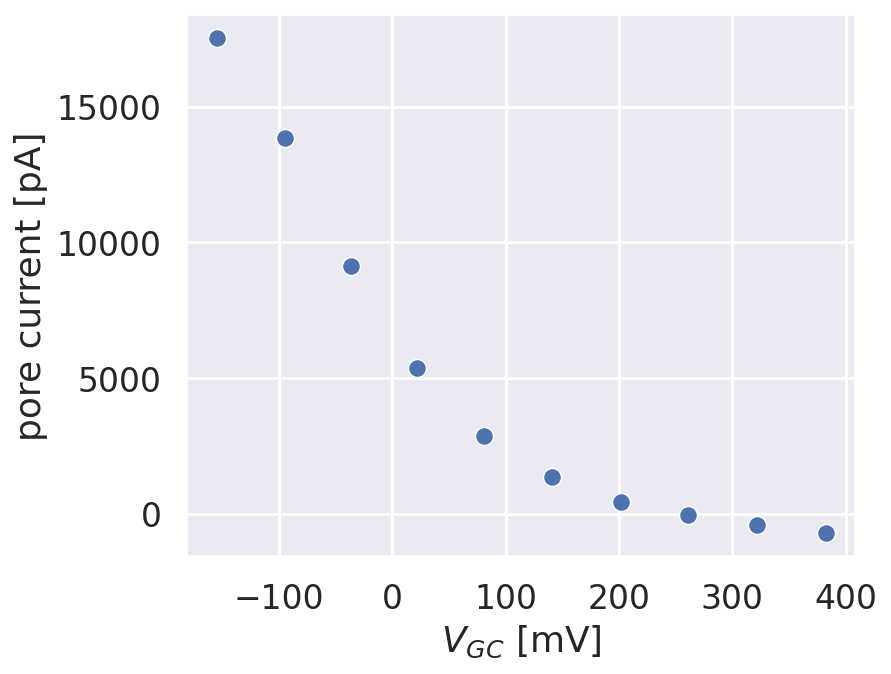

In [520]:
%matplotlib inline
sns.set(rc={'figure.figsize':(6,5)})
sns.set_style()
sns.set_context("talk")
sns.scatterplot(x='VGC',y='I_mean',data=statsDF.loc[statsDF['COMMENTS'].str.contains('6gate')])
# plt.errorbar(statsDF.loc[statsDF['COMMENTS'].str.contains('6gate')]['VGC'],statsDF.loc[statsDF['COMMENTS'].str.contains('6gate')]['I_mean'],
#                yerr=statsDF.loc[statsDF['COMMENTS'].str.contains('6gate')]['I_std'],
#                             elinewidth=2, # width of error bar line
#                             ecolor=t[1],    # color of error bar
#                             capsize=5,     # cap length for error bar
#                             capthick=2,    # cap thickness for error bar
#                             fmt='none',
#                             zorder=50,
#                             alpha=0.5)
plt.xlabel('$V_{GC}$ [mV]')
plt.ylabel('pore current [pA]')

In [514]:
statsDF[['VGC','I_mean','I_std']]

,VGC,I_mean,I_std
0,NaN,-941.747814,18.854806
1,NaN,832.701282,19.222810
2,NaN,4029.168602,20.871869
3,NaN,2865.045316,23.790286
4,NaN,-2689.289132,149.666818
5,NaN,-5337.455743,54.813669
6,NaN,-3955.155108,22.144921
7,NaN,5793.797847,116.312060
8,NaN,1798.460866,36.433984
9,NaN,-2830.070977,67.172462


### IV - pindown WRONG _ DO NOT USE

In [393]:
jupyter_auxilariy_functions.make_branch('20210602A_IV_pindown4_1', 
                    ['/proj/schnellstapel/flat_data_pool/20210623/pindown4gatesweep_500mV'], 
                    LOC = '/proj/jakobuchheim/Analysis')

0

In [394]:
jupyter_auxilariy_functions.checkout('20210602A_IV_pindown4_1', LOC = '/proj/jakobuchheim/Analysis')
pythonCMD = '"python3  src/main.py -t $(THREADS) -f 25000 --expplot --segplot --filterType Bessel --instrumentType Chimera --picklesegment"'
jupyter_auxilariy_functions.batch_run(pythonCMD, NCPU = 15, MEM = 50000, LR = 7, QU='PI', LOC = '/proj/jakobuchheim/Analysis')

0

In [406]:
%mv /proj/jakobuchheim/Analysis/DataAndResults/results /proj/schnellstapel/jakobuchheim/superLatticeData/20210602A_IV_pindown4_1/

In [407]:
resultsPath = Path('/proj/schnellstapel/jakobuchheim/superLatticeData/20210602A_IV_pindown4_1')
files_for_frame = sorted(resultsPath.rglob('./dataframe_atruntime_*.csv'))
# import all data frames in folder
DFlist = []
for fileN in files_for_frame:
    DFlist.append(pd.read_csv(fileN))
statsDF = pd.concat(DFlist, ignore_index = True)
statsDF = statsDF.rename(columns = {'Unnamed: 0':'EXPERIMENTNAME'})

In [412]:
statsDF[['I_mean','VAC','VAG']]

,I_mean,VAC,VAG
0,353.108671,500,72.305000
1,19919.000000,500,555.467500
2,-38.057196,500,11.425000
3,2493.041444,500,192.986667
4,1147.662666,500,131.970000
5,11194.692735,500,496.586667


Text(0, 0.5, 'pore current [pA]')

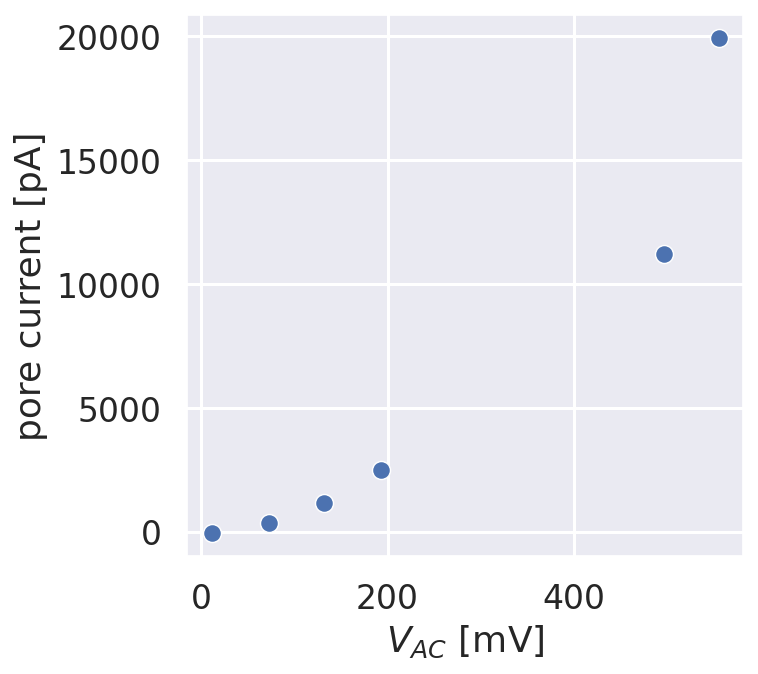

In [413]:
%matplotlib inline
sns.set(rc={'figure.figsize':(5,5)})
sns.set_style()
sns.set_context("talk")
sns.scatterplot(x='VAG',y='I_mean',data=statsDF)
# plt.errorbar(statsDF.loc[statsDF['COMMENTS'].str.contains('after')]['VAC'],statsDF.loc[statsDF['COMMENTS'].str.contains('after')]['I_mean'],
#                yerr=statsDF.loc[statsDF['COMMENTS'].str.contains('after')]['I_std'],
#                             elinewidth=2, # width of error bar line
#                             ecolor=t[1],    # color of error bar
#                             capsize=5,     # cap length for error bar
#                             capthick=2,    # cap thickness for error bar
#                             fmt='none',
#                             zorder=50,
#                             alpha=0.5)
plt.xlabel('$V_{AC}$ [mV]')
plt.ylabel('pore current [pA]')

### 1kBs, -800mV bias, 25kHz

github code base #idealTracePickle fcb7b092

In [111]:
jupyter_auxilariy_functions.checkout('20210602A_pd-1kbs--800-2', LOC = '/proj/jakobuchheim/Repositories')
pythonCMD = '"python3  src/main.py -t $(THREADS) -f 25000 --filterType Bessel --instrumentType Chimera --findevents --kvalueanalysis --mineventdepth 1000 --PDF 6.0 --PDFreversal 0.5 --eventType both --passes 4 --avwindow 0.5 --plotidealevents 1.0 --picklesegment"'
jupyter_auxilariy_functions.batch_run(pythonCMD, NCPU = 8, MEM = 150000, LR = 8, QU='CH', LOC = '/proj/jakobuchheim/Repositories')

0

In [112]:
%mv /proj/jakobuchheim/Repositories/DataAndResults/results /proj/schnellstapel/jakobuchheim/superLatticeData/20210602A_pd-1kbs--800-2_newEoE_woHistBaseline_idealtrace_25kHz/

In [590]:
resultsPath = Path('/proj/schnellstapel/jakobuchheim/superLatticeData/20210602A_pd-1kbs--800-2_newEoE_woHistBaseline_idealtrace_25kHz/')
files_for_frame = sorted(resultsPath.rglob('./dataframe_atruntime_*.csv'))
# import all data frames in folder
DFlist = []
for fileN in files_for_frame:
    DFlist.append(pd.read_csv(fileN))
statsDF = pd.concat(DFlist, ignore_index = True)
statsDF = statsDF.rename(columns = {'Unnamed: 0':'EXPERIMENTNAME'})

In [591]:
resultsPath = Path('/proj/schnellstapel/jakobuchheim/superLatticeData/20210602A_pd-1kbs--800-2_newEoE_woHistBaseline_idealtrace_25kHz/')
files_for_frame = sorted(resultsPath.rglob('./*/*events.csv'))
# import all data frames in folder
DFlist = []
for fileN in files_for_frame:
    tmp = pd.read_csv(fileN)
    tmp['EXPERIMENTNAME'] = str(fileN.name).split('_events')[0]
    DFlist.append(tmp)
eventsDF = pd.concat(DFlist, ignore_index = True)

In [592]:
df = pd.merge(eventsDF, statsDF, how = 'left', on = ["EXPERIMENTNAME"])
df['EVENTCHARGE'] = df['EVENTDWELLTIME'] * df['EVENTDEPTH'] * 1.0e-12 * 1.0e-6 / 1.6e-19
df['VAG_y'] = np.round(df['VAG_y'])
df['VGC'] = df['VAC_x'] - df['VAG_y']
df.columns = df.columns.str.replace("_y", "")

In [593]:
a = df.loc[df['EVENTTYPE'] == 'down'].groupby('EXPERIMENTNAME')[['NUMBEROFEVENTS_x']].count()

In [594]:
df_m800mV = df.loc[((df['EVENTTYPE'] == 'down') & (df['EVENTDWELLTIME'] <1e4) & (df['EVENTDWELLTIME'] >1e2))].groupby('EXPERIMENTNAME').aggregate(
    {'NUMBEROFEVENTS_x': np.count_nonzero,'TOTALTRACETIME_x': np.mean,'EVENTDEPTH': [np.mean, np.std],'EVENTDWELLTIME': [np.mean, np.std],'VAG': np.nanmean,'VGC': np.nanmean})

df_m800mV.columns = ["_".join(a) for a in df_m800mV.columns.to_flat_index()]
df_m800mV.columns = df_m800mV.columns.str.replace("_y", "").str.replace("nan", "").str.replace("_mean", "").str.replace("_count_nonzero", "")
df_m800mV['EVENTRATE']=df_m800mV['NUMBEROFEVENTS_x'] / df_m800mV['TOTALTRACETIME_x'] * 1e6
display(df_m800mV)

,NUMBEROFEVENTS_x,TOTALTRACETIME_x,EVENTDEPTH,EVENTDEPTH_std,EVENTDWELLTIME,EVENTDWELLTIME_std,VAG,VGC,EVENTRATE
EXPERIMENTNAME,,,,,,,,,
20210624-175707_20210602A_1MKCl_pindown1kbpdsDNAfrontsweepmoregate_-800_mV_0_-800mV,12,8.268024e+07,-14286.383037,677.377394,635.759986,41.100242,108.0,-908.0,0.145137
20210624-175707_20210602A_1MKCl_pindown1kbpdsDNAfrontsweepmoregate_-800_mV_1_-800mV,11,8.367230e+07,-12719.612199,111.952243,879.709071,82.945634,-15.0,-785.0,0.131465
20210624-175707_20210602A_1MKCl_pindown1kbpdsDNAfrontsweepmoregate_-800_mV_2_-800mV,28,8.365430e+07,-11981.420484,195.550016,1017.051406,127.282903,-141.0,-659.0,0.334711
20210624-175707_20210602A_1MKCl_pindown1kbpdsDNAfrontsweepmoregate_-800_mV_3_-800mV,34,8.365729e+07,-11689.413083,282.812441,1092.959975,140.998386,-262.0,-538.0,0.406420
20210624-175707_20210602A_1MKCl_pindown1kbpdsDNAfrontsweepmoregate_-800_mV_4_-800mV,33,8.369789e+07,-11551.210048,228.934286,1094.138170,149.661942,-386.0,-414.0,0.394275
20210624-175707_20210602A_1MKCl_pindown1kbpdsDNAfrontsweepmoregate_-800_mV_5_-800mV,57,8.369188e+07,-11277.692419,318.703890,1155.637882,209.064794,-511.0,-289.0,0.681070
20210624-175707_20210602A_1MKCl_pindown1kbpdsDNAfrontsweepmoregate_-800_mV_6_-800mV,52,8.369488e+07,-10209.974720,330.824402,1574.141521,282.383641,-635.0,-165.0,0.621304
20210624-175707_20210602A_1MKCl_pindown1kbpdsDNAfrontsweepmoregate_-800_mV_7_-800mV,119,8.367689e+07,-6741.984952,788.009438,2331.420479,820.429168,-759.0,-41.0,1.422137


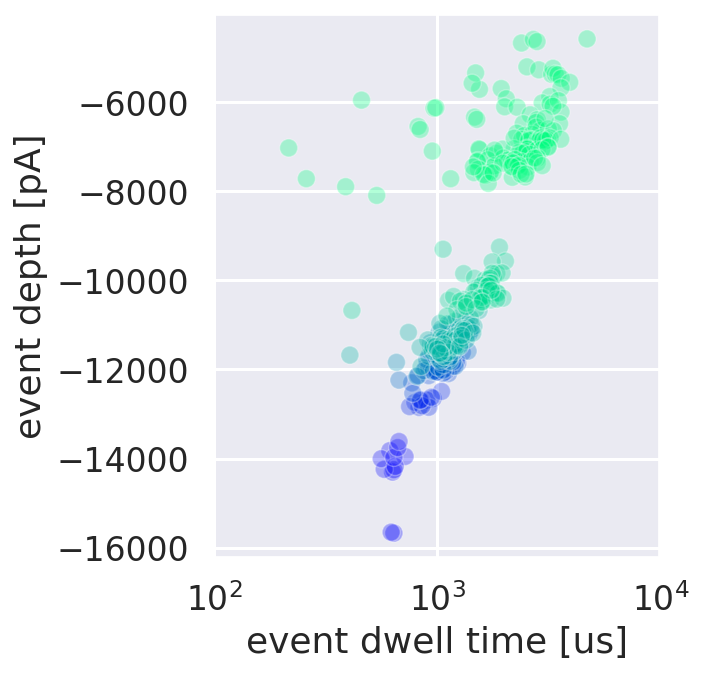

In [595]:
sns.set(rc={'figure.figsize':(4,5)})
sns.set_style()
sns.set_context("talk")
cmap = sns.color_palette("winter", as_cmap=True)
p = sns.scatterplot(palette = cmap, alpha = 0.3, x = 'EVENTDWELLTIME', y = 'EVENTDEPTH', hue = 'VGC', data = df.loc[((df['EVENTDWELLTIME'] >1e2) & (df['EVENTDWELLTIME'] <1e4) & (df['EVENTTYPE'] =='down') &~((df['VAG']<-750)&(df['EVENTDEPTH']>-1500)))])
p.set(xscale="log")
plt.xlabel('event dwell time [us]')
plt.ylabel('event depth [pA]')
plt.xlim([1e2,1e4])
# plt.ylim([-1.700e4,-0.1e4])
plt.legend([],[], frameon=False)

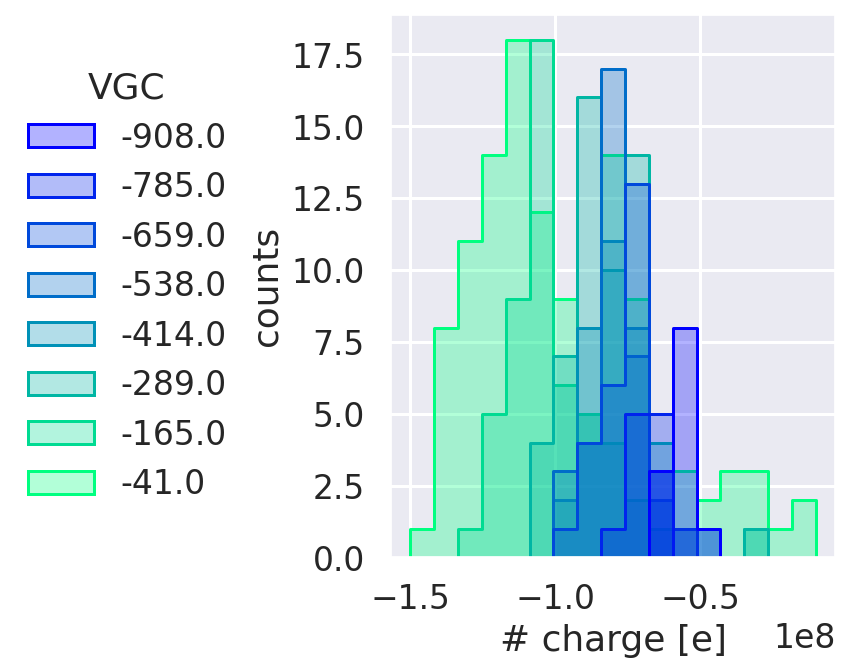

In [596]:
def move_legend(ax, new_loc, **kws):
    old_legend = ax.legend_
    handles = old_legend.legendHandles
    labels = [t.get_text() for t in old_legend.get_texts()]
    title = old_legend.get_title().get_text()
    ax.legend(handles, labels, loc=new_loc, title=title, **kws)
    
cmap = sns.color_palette("winter", as_cmap=True)
ax = sns.histplot(palette = cmap, alpha = 0.3, x='EVENTCHARGE', hue ='VGC', data = df.loc[((df['EVENTDWELLTIME'] >1e2) & (df['EVENTDWELLTIME'] <1e4) & (df['EVENTTYPE'] =='down') &~((df['VAG']<-750)&(df['EVENTDEPTH']>-1500)))], element="step", binrange = [-1.5e8,-1e7])
plt.xlabel('# charge [e]')
plt.ylabel('counts')
# plt.legend([],[], frameon=False)
move_legend(ax,"right", bbox_to_anchor=(-0.3,0.5), ncol=1, frameon=False)
# box = ax.get_position()
# ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
# ax.legend(loc='center right', bbox_to_anchor=(1, 0.5))

# plt.legend(bbox_to_anchor=(1.01, 1),
#            borderaxespad=0)

### 1kBs, -900mV bias, 25kHz

github code base #idealTracePickle fcb7b092

In [158]:
jupyter_auxilariy_functions.checkout('20210602A_pd-1kbs--900-1', LOC = '/proj/jakobuchheim/Repositories')
pythonCMD = '"python3  src/main.py -t $(THREADS) -f 25000 --filterType Bessel --instrumentType Chimera --findevents --kvalueanalysis --mineventdepth 1000 --PDF 6.0 --PDFreversal 0.5 --eventType both --passes 4 --avwindow 0.5 --plotidealevents 1.0 --picklesegment"'
jupyter_auxilariy_functions.batch_run(pythonCMD, NCPU = 8, MEM = 100000, LR = 8, QU='CH', LOC = '/proj/jakobuchheim/Repositories')

0

In [210]:
%mv /proj/jakobuchheim/Repositories/DataAndResults/results /proj/schnellstapel/jakobuchheim/superLatticeData/20210602A_pd-1kbs--900-1_newEoE_woHistBaseline_idealtrace_25kHz_2/

In [488]:
resultsPath = Path('/proj/schnellstapel/jakobuchheim/superLatticeData/20210602A_pd-1kbs--900-1_newEoE_woHistBaseline_idealtrace_25kHz_2/')
files_for_frame = sorted(resultsPath.rglob('./dataframe_atruntime_*.csv'))
# import all data frames in folder
DFlist = []
for fileN in files_for_frame:
    DFlist.append(pd.read_csv(fileN))
statsDF = pd.concat(DFlist, ignore_index = True)
statsDF = statsDF.rename(columns = {'Unnamed: 0':'EXPERIMENTNAME'})

In [489]:
resultsPath = Path('/proj/schnellstapel/jakobuchheim/superLatticeData/20210602A_pd-1kbs--900-1_newEoE_woHistBaseline_idealtrace_25kHz_2/')
files_for_frame = sorted(resultsPath.rglob('./*/*events.csv'))
# import all data frames in folder
DFlist = []
for fileN in files_for_frame:
    tmp = pd.read_csv(fileN)
    tmp['EXPERIMENTNAME'] = str(fileN.name).split('_events')[0]
    DFlist.append(tmp)
eventsDF = pd.concat(DFlist, ignore_index = True)

In [490]:
df = pd.merge(eventsDF, statsDF, how = 'left', on = ["EXPERIMENTNAME"])
df['VAG_y'] = np.round(df['VAG_y'])
df['VGC'] = df['VAC_x'] - df['VAG_y']
df.columns = df.columns.str.replace("_y", "")

In [491]:
a = df.loc[df['EVENTTYPE'] == 'down'].groupby('EXPERIMENTNAME')[['NUMBEROFEVENTS_x']].count()

In [492]:
df_m900mV=df.loc[((df['EVENTTYPE'] == 'down') & (df['EVENTDWELLTIME'] <1e4))].groupby('EXPERIMENTNAME').aggregate(
    {'NUMBEROFEVENTS_x': np.count_nonzero,'TOTALTRACETIME_x': np.mean,'EVENTDEPTH': [np.mean, np.std],'EVENTDWELLTIME': [np.mean, np.std],'VAG': np.nanmean,'VGC': np.nanmean})
df_m900mV.columns = ["_".join(a) for a in df_m900mV.columns.to_flat_index()]
df_m900mV.columns = df_m900mV.columns.str.replace("_y", "").str.replace("nan", "").str.replace("_mean", "").str.replace("_count_nonzero", "")
df_m900mV['EVENTRATE']=df_m900mV['NUMBEROFEVENTS_x'] / df_m900mV['TOTALTRACETIME_x'] * 1e6
display(df_m900mV)


,NUMBEROFEVENTS_x,TOTALTRACETIME_x,EVENTDEPTH,EVENTDEPTH_std,EVENTDWELLTIME,EVENTDWELLTIME_std,VAG,VGC,EVENTRATE
EXPERIMENTNAME,,,,,,,,,
20210624-181005_20210602A_1MKCl_pindown1kbpdsDNAfrontsweepmoregate_-900_mV_0_-900mV,22,1.128499e+08,-13211.362478,1865.187945,406.865428,223.544005,109.0,-1009.0,0.194949
20210624-181005_20210602A_1MKCl_pindown1kbpdsDNAfrontsweepmoregate_-900_mV_1_-900mV,38,1.140500e+08,-12643.541761,262.082688,892.193625,153.004743,-28.0,-872.0,0.333187
20210624-181005_20210602A_1MKCl_pindown1kbpdsDNAfrontsweepmoregate_-900_mV_2_-900mV,60,1.137320e+08,-11834.811000,294.398346,1102.463927,182.841106,-164.0,-736.0,0.527556
20210624-181005_20210602A_1MKCl_pindown1kbpdsDNAfrontsweepmoregate_-900_mV_3_-900mV,30,1.140890e+08,-11620.295899,375.135169,1147.967924,189.479566,-299.0,-601.0,0.262953
20210624-181005_20210602A_1MKCl_pindown1kbpdsDNAfrontsweepmoregate_-900_mV_4_-900mV,90,1.138810e+08,-11423.261885,553.162258,1120.127926,242.571998,-436.0,-464.0,0.790299
20210624-181005_20210602A_1MKCl_pindown1kbpdsDNAfrontsweepmoregate_-900_mV_5_-900mV,94,1.137460e+08,-11084.150666,353.673221,1242.873109,189.614722,-574.0,-326.0,0.826403
20210624-181005_20210602A_1MKCl_pindown1kbpdsDNAfrontsweepmoregate_-900_mV_6_-900mV,65,1.141436e+08,-8986.508736,735.042046,1832.743280,449.063163,-709.0,-191.0,0.569458
20210624-181005_20210602A_1MKCl_pindown1kbpdsDNAfrontsweepmoregate_-900_mV_7_-900mV,270,1.139326e+08,-3378.181405,1060.024519,1848.703895,1421.508786,-845.0,-55.0,2.369823


(100.0, 10000.0)

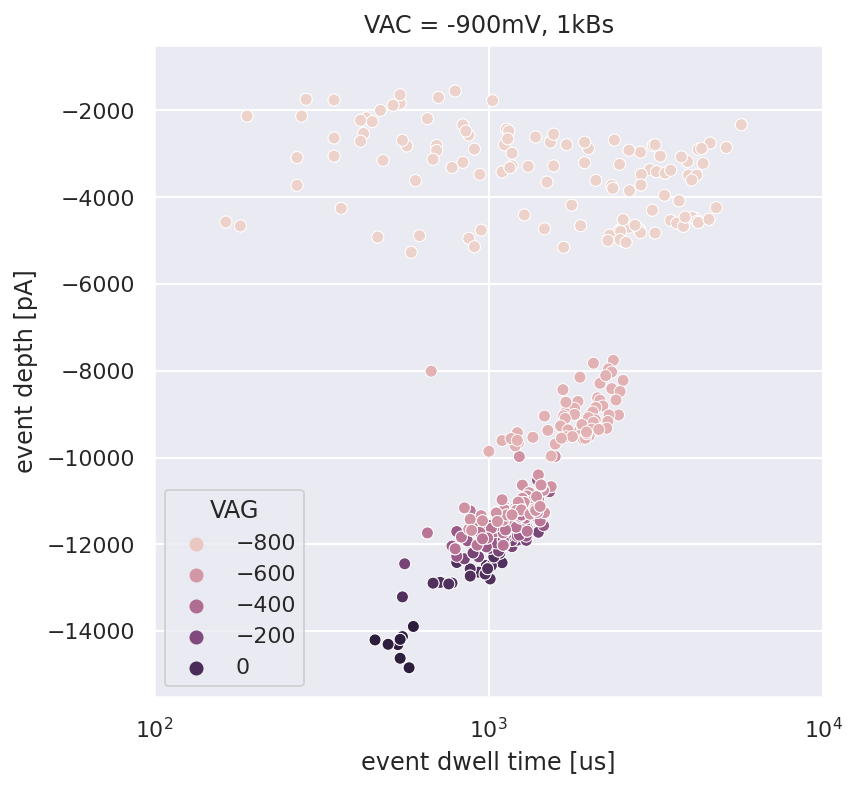

In [493]:
sns.set(rc={'figure.figsize':(6,6)})
sns.set_style()
p = sns.scatterplot(x = 'EVENTDWELLTIME', y = 'EVENTDEPTH', hue = 'VAG', data = df.loc[((df['EVENTDWELLTIME'] >1e1) &(df['EVENTTYPE'] =='down') &~((df['VAG']<-750)&(df['EVENTDEPTH']>-1500)))])
p.set(xscale="log")
plt.title('VAC = -900mV, 1kBs')
plt.xlabel('event dwell time [us]')
plt.ylabel('event depth [pA]')
plt.xlim([1e2,1e4])
# plt.ylim([-1.700e4,-0.1e4])

## Plots for pindown -800, -900mV

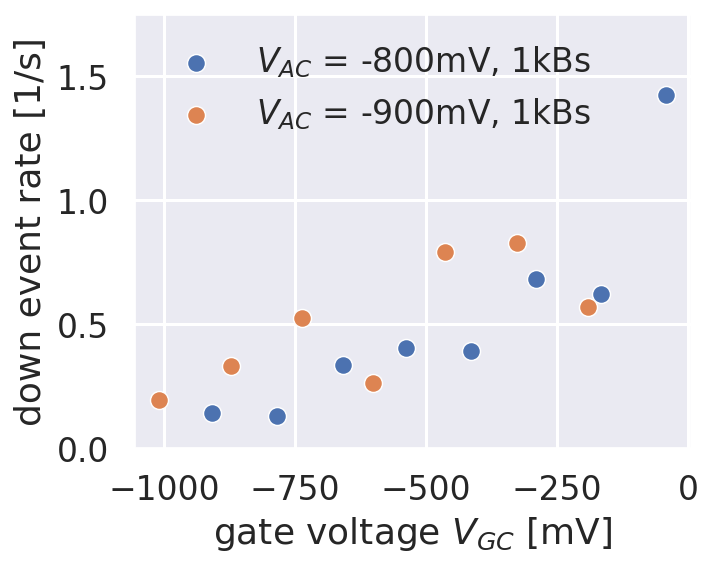

In [603]:
sns.set(rc={'figure.figsize':(5,4)})
sns.set_style()
sns.set_context("talk")
sns.scatterplot(x='VGC', y='EVENTRATE', data=df_m800mV, label='$V_{AC}$ = -800mV, 1kBs')
sns.scatterplot(x='VGC', y='EVENTRATE', data=df_m900mV.loc[df_m900mV['VAG']>=-800,:], label='$V_{AC}$ = -900mV, 1kBs')
plt.ylim([0,1.75])
plt.ylabel('down event rate [1/s]')
plt.xlabel('gate voltage $V_{GC}$ [mV]')
plt.legend(frameon=False)
# plt.title('event rate')
# 

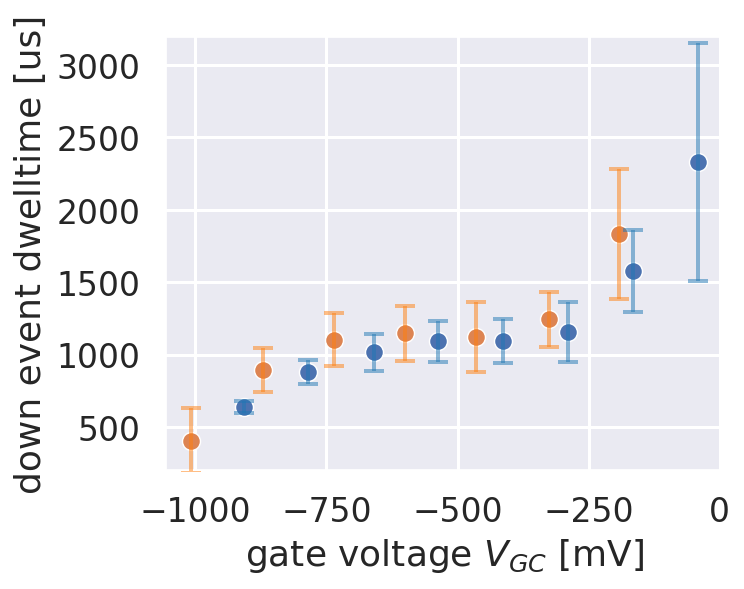

In [604]:
t=sns.color_palette("tab10",2)
sns.scatterplot(x='VGC', y='EVENTDWELLTIME', data=df_m800mV, label='$V_{AC}$ = -800mV, 1kBs', palette=t[0])
plt.errorbar(df_m800mV['VGC'],df_m800mV['EVENTDWELLTIME'],
               yerr=df_m800mV['EVENTDWELLTIME_std'],
                            elinewidth=2, # width of error bar line
                            ecolor=t[0],    # color of error bar
                            capsize=5,     # cap length for error bar
                            capthick=2,    # cap thickness for error bar
                            fmt='none',
                            zorder=50,
                            alpha=0.5)
sns.scatterplot(x='VGC', y='EVENTDWELLTIME', data=df_m900mV.loc[df_m900mV['VAG']>=-800,:], label='$V_{AC}$ = -900mV, 1kBs', palette=t[1])
plt.errorbar(df_m900mV.loc[df_m900mV['VAG']>=-800,:]['VGC'],df_m900mV.loc[df_m900mV['VAG']>=-800,:]['EVENTDWELLTIME'],
               yerr=df_m900mV.loc[df_m900mV['VAG']>=-800,:]['EVENTDWELLTIME_std'],
                            elinewidth=2, # width of error bar line
                            ecolor=t[1],    # color of error bar
                            capsize=5,     # cap length for error bar
                            capthick=2,    # cap thickness for error bar
                            fmt='none',
                            zorder=50,
                            alpha=0.5)

plt.ylabel('down event dwelltime [us]')
plt.ylim([200,3200])
plt.xlabel('gate voltage $V_{GC}$ [mV]')
# plt.title('median event dwell time')
plt.legend([],[], frameon=False)

## Plot traces

In [301]:
Path.cwd()

PosixPath('/proj/jakobuchheim/Repositories/Schnellstapel/src/custom_pandas')

In [371]:
import pickle
sys.path.append(str(Path.cwd().parent.parent / "src" / "classes"))
sys.path.append(str(Path.cwd().parent.parent / "src" / "utils"))

import data_classes
import filter_utils
# import main
import parser_utils
import import_utils
def read_pckl_data(readFile):
    with open(readFile, "rb") as f:
        seg = pickle.load(f)
    if ((hasattr(seg,'hmmTrace')) & (hasattr(seg,'idealTrace'))):
        seg.hmmTrace = seg.hmmTrace-np.mean(seg.hmmTrace)
        return seg.IaRAW, seg.Ia, seg.samplerate, seg.exp.metaData["SETUP_ADCSAMPLERATE"], seg.hmmTrace, seg.idealTrace
    elif hasattr(seg,'hmmTrace'):
        seg.hmmTrace = seg.hmmTrace-np.mean(seg.hmmTrace)
        return seg.IaRAW, seg.Ia, seg.samplerate, seg.exp.metaData["SETUP_ADCSAMPLERATE"], seg.hmmTrace, None
    elif hasattr(seg,'idealTrace'):
        return seg.IaRAW, seg.Ia, seg.samplerate, seg.exp.metaData["SETUP_ADCSAMPLERATE"], None, seg.idealTrace
    elif not hasattr(seg,'IaRAW'):
        # k=np.zeros((len(seg[0])))
        # k[:]=seg[0]
        return None,seg[0] ,seg[1], None, None, None
    else:
        return seg.IaRAW, seg.Ia, seg.samplerate, seg.exp.metaData["SETUP_ADCSAMPLERATE"], None, None
    

    
readFile = Path('/proj/schnellstapel/jakobuchheim/superLatticeData/20210602A_pd-1kbs--800-2_newEoE_woHistBaseline_idealtrace/pickledData/20210624-175707_20210602A_1MKCl_pindown1kbpdsDNAfrontsweepmoregate_-800_mV_2_-800mV_savedTrace.pckl')
    
IaRAW, Ia, samplerate, ADC_sample, hmmTrace, idealTrace = read_pckl_data(readFile)

time = np.arange(0, len(Ia)) / samplerate

<IPython.core.display.Javascript object>


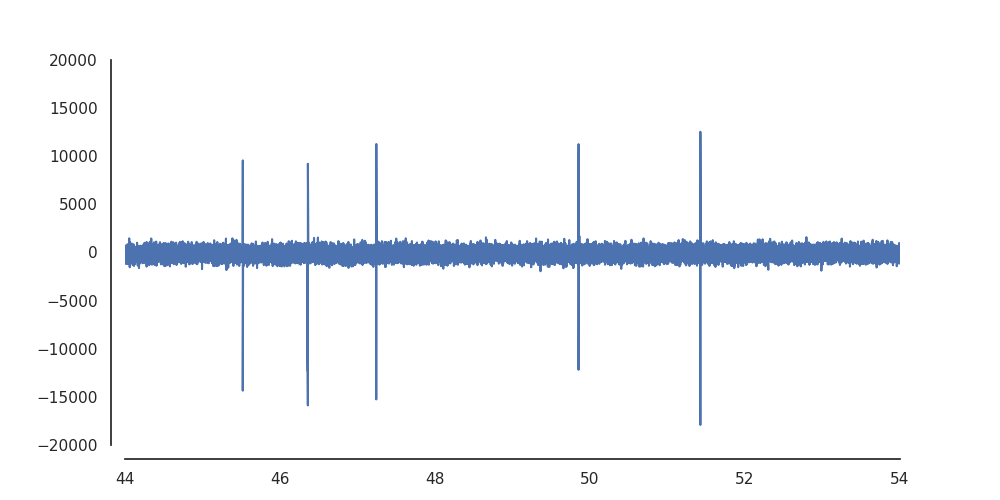

In [366]:
%matplotlib notebook
sns.set(rc={'figure.figsize':(10,5)})
sns.set_style("white")
start = np.int64(np.floor(44.00 * samplerate))
length = 50000000
sns.lineplot(x=time[start:start+length:100],y=Ia[start:start+length:100])
plt.xlim([44,54])
plt.ylim([-20000,20000])
sns.despine(offset=10, trim=True);

<IPython.core.display.Javascript object>


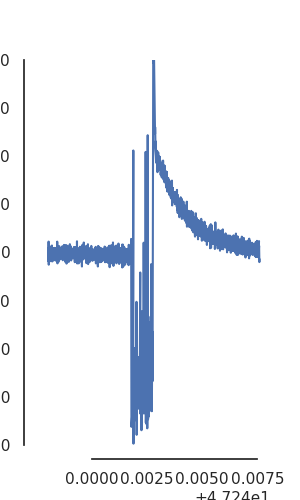

In [379]:
sns.set(rc={'figure.figsize':(3,5)})
sns.set_style("white")
start = np.int64(np.floor(47.238 * samplerate))
length = 4000
sns.lineplot(x=time[start:start+length],y=Ia[start:start+length])
plt.ylim([-20000,20000])
sns.despine(offset=10, trim=True);

<IPython.core.display.Javascript object>


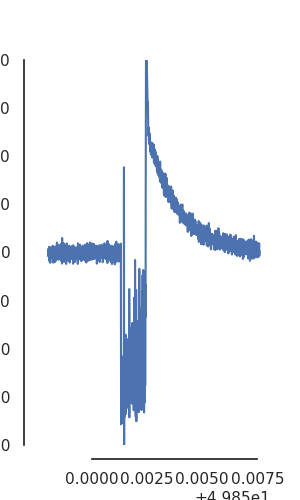

In [376]:
sns.set(rc={'figure.figsize':(3,5)})
sns.set_style("white")
start = np.int64(np.floor(49.848 * samplerate))
length = 4000
sns.lineplot(x=time[start:start+length],y=Ia[start:start+length])
plt.ylim([-20000,20000])
sns.despine(offset=10, trim=True);

<IPython.core.display.Javascript object>


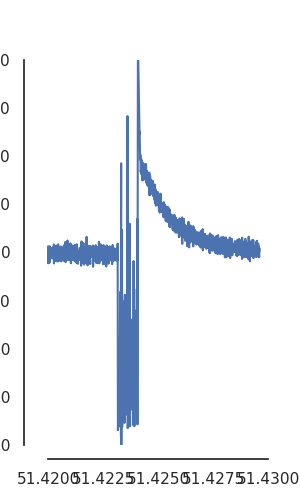

In [377]:
sns.set(rc={'figure.figsize':(3,5)})
sns.set_style("white")
start = np.int64(np.floor(51.420 * samplerate))
length = 4000
sns.lineplot(x=time[start:start+length],y=Ia[start:start+length])
plt.ylim([-20000,20000])
sns.despine(offset=10, trim=True);

<IPython.core.display.Javascript object>


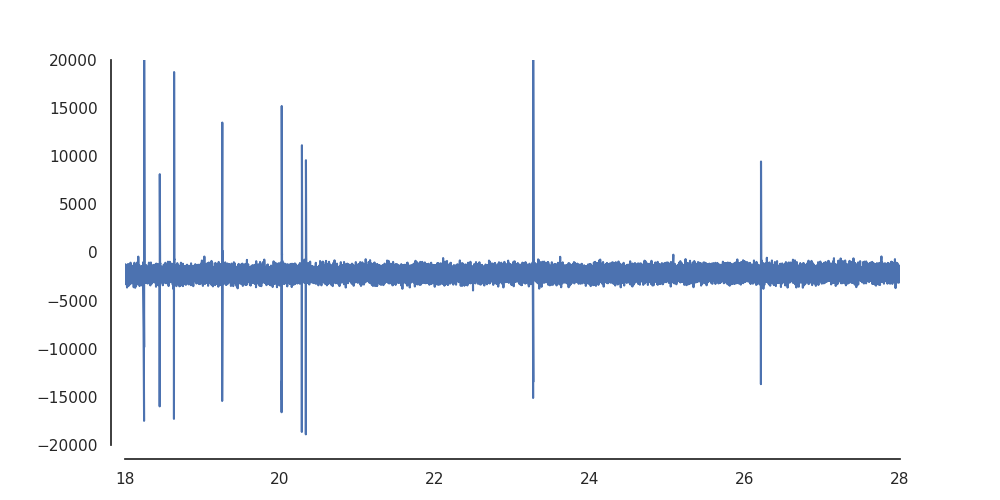

In [380]:
readFile = Path('/proj/schnellstapel/jakobuchheim/superLatticeData/20210602A_pd-1kbs--800-2_newEoE_woHistBaseline_idealtrace/pickledData/20210624-175707_20210602A_1MKCl_pindown1kbpdsDNAfrontsweepmoregate_-800_mV_6_-800mV_savedTrace.pckl')
IaRAW, Ia, samplerate, ADC_sample, hmmTrace, idealTrace = read_pckl_data(readFile)

time = np.arange(0, len(Ia)) / samplerate
%matplotlib notebook
sns.set(rc={'figure.figsize':(10,5)})
sns.set_style("white")
start = 10000
length = 50000000
sns.lineplot(x=time[start:start+length:100],y=Ia[start:start+length:100])
plt.xlim([18,28])
plt.ylim([-20000,20000])
sns.despine(offset=10, trim=True);

<IPython.core.display.Javascript object>


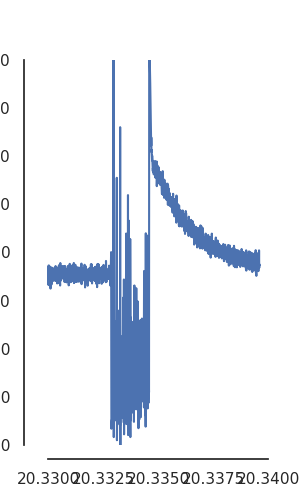

In [382]:
sns.set(rc={'figure.figsize':(3,5)})
sns.set_style("white")
start = np.int64(np.floor(20.33 * samplerate))

length = 4000
sns.lineplot(x=time[start:start+length],y=Ia[start:start+length])
# plt.xlim([0,10])
plt.ylim([-20000,20000])
sns.despine(offset=10, trim=True)

<IPython.core.display.Javascript object>


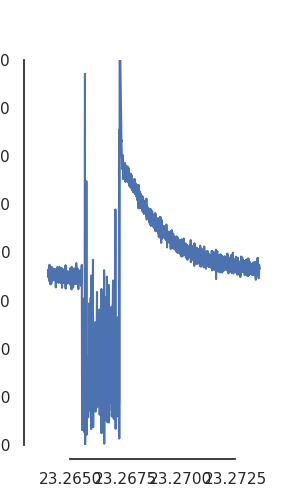

In [386]:
sns.set(rc={'figure.figsize':(3,5)})
sns.set_style("white")
start = np.int64(np.floor(23.264 * samplerate))

length = 4000
sns.lineplot(x=time[start:start+length],y=Ia[start:start+length])
# plt.xlim([0,10])
plt.ylim([-20000,20000])
sns.despine(offset=10, trim=True);

<IPython.core.display.Javascript object>


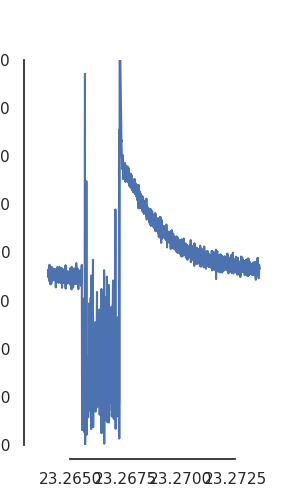

In [381]:
sns.set(rc={'figure.figsize':(3,5)})
sns.set_style("white")
start = np.int64(np.floor(26.2025 * samplerate))
length = 4000
sns.lineplot(x=time[start:start+length],y=Ia[start:start+length])
# plt.xlim([0,10])
plt.ylim([-20000,20000])
sns.despine(offset=10, trim=True);

In [385]:
4000/samplerate

0.009600000000000001

## Plot Zimm time

as in paper Chen, Kaikai, Ining Jou, Niklas Ermann, Murugappan Muthukumar, Ulrich F. Keyser, and Nicholas A. W. Bell. “Dynamics of Driven Polymer Transport through a Nanopore.” Nature Physics, June 24, 2021, 1–7. https://doi.org/10.1038/s41567-021-01268-2.
we can plot event dwell time vs DNA relaxation time (Zimm length). Used there reference source data!!

In [552]:
ZimmDF = pd.read_excel('/proj/schnellstapel/jakobuchheim/superLatticeData/41567_2021_1268_MOESM4_ESM.xls')

In [553]:
ZimmDF

,Paper,DNA length,Translocation time
0,Li 2003,3000,0.00006
1,Chen 2004,10000,0.00040
2,Storm 2005,97000,0.00450
3,Mihovilovic 2013,48500,0.00180
4,Bell 2015,1000,0.00020
5,Sharma 2019,48500,0.00100
6,This work,7228,0.00100


In [554]:
ZimmDF.loc[6,'Paper'] = 'Chen 2021'

In [547]:
def zimmTime(Nbp):
    """
    calculates chain relaxation time of dsDNA in water at 20C 
    
    input:
        N float
        number of base pairs of DNA
    
    return:
        time float
        in unit of [s]
    """
    kB = 1.380649e-23 # [J / K]
    T = 293.5 # [K] room temperature 20C
    eta = 1.016e-3 # [Pa s] water @20C
    l0 = 80e-9 # [m] Kuhnn length of dsDNA
    lbp = 0.34e-9
    NKuhn = lbp * Nbp / l0
    return 0.3 * eta * np.power(np.sqrt(NKuhn) * l0, 3.0) / kB / T

In [548]:
N = np.arange(500, 100e3, 10)
zT = zimmTime(N)

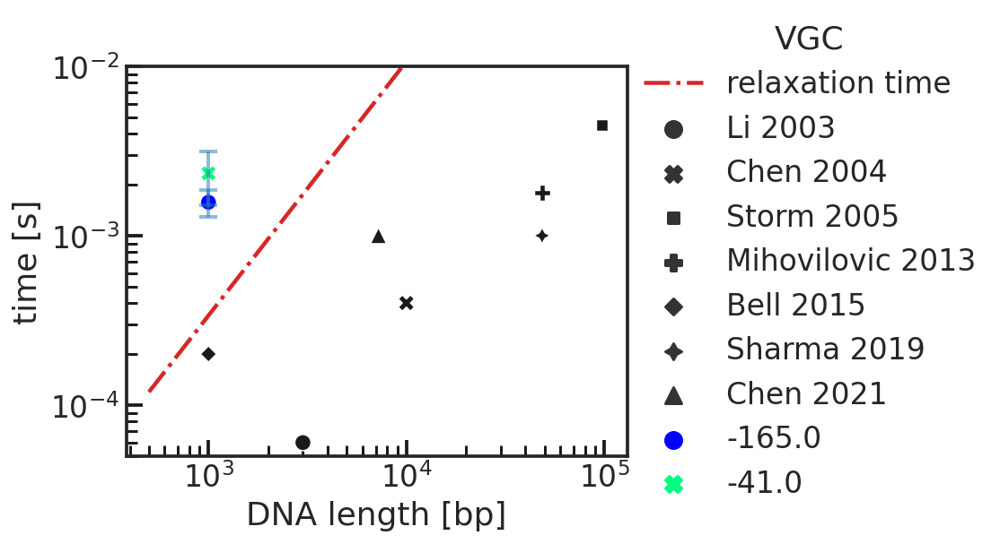

In [602]:
sns.set(rc={'figure.figsize':(5,4)})
sns.set_style()
sns.set_context("talk")
sns.set_style("ticks")
ax = sns.lineplot(x = N, y = zT, linestyle ='-.',label = 'relaxation time', color = sns.color_palette("tab10")[3])
sns.scatterplot(x = 'DNA length', y = 'Translocation time', style = 'Paper', data = ZimmDF, color = 'k')
df_m800mV['DNA length'] = 1e3
cmap = sns.color_palette("winter", as_cmap=True)
sns.scatterplot(x = 'DNA length', y=df_m800mV.loc[df_m800mV['VGC'] >-250]['EVENTDWELLTIME'] / 1e6, data=df_m800mV.loc[df_m800mV['VGC'] >-250], style = 'VGC', hue='VGC', palette=cmap)#sns.color_palette("tab10")[0:2])
plt.errorbar(df_m800mV.loc[df_m800mV['VGC'] >-250]['DNA length'],df_m800mV.loc[df_m800mV['VGC'] >-250]['EVENTDWELLTIME'] /1e6,
               yerr=df_m800mV.loc[df_m800mV['VGC'] >-250]['EVENTDWELLTIME_std'] / 1e6,
                            elinewidth=2, # width of error bar line
                            ecolor=t[0],    # color of error bar
                            capsize=5,     # cap length for error bar
                            capthick=2,    # cap thickness for error bar
                            fmt='none',
                            zorder=50,
                            alpha=0.5)
# sns.scatterplot(x = 'DNA length', y=df_m800mV.loc[df_m900mV['VGC'] >-250]['EVENTDWELLTIME'] / 1e6, data=df_m900mV.loc[df_m900mV['VGC'] >-250], style = 'VGC', hue='VGC', palette=cmap)#sns.color_palette("tab10")[0:2])
# plt.errorbar(df_m900mV.loc[df_m900mV['VGC'] >-250]['DNA length'],df_m900mV.loc[df_m900mV['VGC'] >-250]['EVENTDWELLTIME'] /1e6,
#                yerr=df_m900mV.loc[df_m900mV['VGC'] >-250]['EVENTDWELLTIME_std'] / 1e6,
#                             elinewidth=2, # width of error bar line
#                             ecolor=t[0],    # color of error bar
#                             capsize=5,     # cap length for error bar
#                             capthick=2,    # cap thickness for error bar
#                             fmt='none',
#                             zorder=50,
#                             alpha=0.5)



ax.tick_params(which = "both", direction = 'in', color = 'k', bottom = True, left = True)
plt.xlabel('DNA length [bp]')
plt.ylabel('time [s]')
plt.semilogx()
move_legend(ax,"right", bbox_to_anchor=(1.75,0.5), ncol=1, frameon=False)
plt.ylim([5e-5,1e-2])
plt.semilogy();

In [605]:
zimmTime(1e3)

0.0003374247466365617